## PROJECT 6: UNSUPERVISED LEARNING - Economic Freedom Index_alt - Sai K (04/12/2023)

## Description

**Background & Context**

Created in 1995 by the Heritage Foundation, The Index of Economic Freedom is a ranking created to measure the economic freedom in the countries of the world. Now, in its 25th edition, The Economic Freedom Index is poised to help readers track over two decades of the advancement in economic freedom, prosperity, and opportunity and promote these ideas in their homes, schools, and communities. The Index covers 12 freedoms, from property rights to financial freedom, in 186 countries.

**Objective**

To analyse the data, use clustering algorithms to identify different groups of countries based on economic freedom, and list the insights from the analysis.

**Data Description**
The data comprises factors indicating economic freedom. The list of variables in the data is given below. All these features are self-explanatory and more details can be found in the data source listed below.

* CountryID
* Country Name
* WEBNAME
* Region
* World Rank
* Region Rank
* 2019 Score
* Property Rights
* Judical Effectiveness
* Government Integrity
* Tax Burden
* Gov't Spending
* Fiscal Health
* Business Freedom
* Labor Freedom
* Monetary Freedom
* Trade Freedom
* Investment Freedom
* Financial Freedom
* Tariff Rate (%)
* Income Tax Rate (%)
* Corporate Tax Rate (%)
* Tax Burden % of GDP
* Gov't Expenditure % of GDP
* Country
* Population (Millions)
* GDP (Billions, PPP)
* GDP Growth Rate (%)
* 5 Year GDP Growth Rate (%)
* GDP per Capita (PPP)
* Unemployment (%)
* Inflation (%)
* FDI Inflow (Millions)
* Public Debt (% of GDP)


### Loading Librarires

In [1]:
# this will help in making the Python code more structured automatically (good coding practice)
%load_ext nb_black

# Libraries to help with reading and manipulating data
import pandas as pd
import numpy as np

# libaries to help with data visualization
import matplotlib.pyplot as plt
import seaborn as sns

# Removes the limit for the number of displayed columns
pd.set_option("display.max_columns", None)
# Sets the limit for the number of displayed rows
pd.set_option("display.max_rows", 200)

# to scale the data using z-score
from sklearn.preprocessing import StandardScaler

# to compute distances
from scipy.spatial.distance import cdist, pdist

# to perform k-means clustering and compute silhouette scores
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# to visualize the elbow curve and silhouette scores
from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer

# to perform hierarchical clustering, compute cophenetic correlation, and create dendrograms
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage, cophenet

# to suppress warnings
import warnings

warnings.filterwarnings("ignore")

<IPython.core.display.Javascript object>

### Reading the dataset

In [2]:
# loading the dataset
data = pd.read_csv(
    "C:/Users/OneDrive/Desktop/Python/7_unsupervised_learning/project/econimic_freedom_index_alt/Economic_Freedom_Index-DATASET.csv",
    encoding="ISO-8859-1",
)

<IPython.core.display.Javascript object>

### Overview of the dataset

**view the first (5), last (5) and (10) random rows of the dataset**

In [3]:
# viewing the first 5 rows of the data
data.head()

,CountryID,Country Name,WEBNAME,Region,World Rank,Region Rank,2019 Score,Property Rights,Judical Effectiveness,Government Integrity,Tax Burden,Gov't Spending,Fiscal Health,Business Freedom,Labor Freedom,Monetary Freedom,Trade Freedom,Investment Freedom,Financial Freedom,Tariff Rate (%),Income Tax Rate (%),Corporate Tax Rate (%),Tax Burden % of GDP,Gov't Expenditure % of GDP,Country,Population (Millions),"GDP (Billions, PPP)",GDP Growth Rate (%),5 Year GDP Growth Rate (%),GDP per Capita (PPP),Unemployment (%),Inflation (%),FDI Inflow (Millions),Public Debt (% of GDP)
0,1,Afghanistan,Afghanistan,Asia-Pacific,152.0,39.0,51.5,19.6,29.6,25.2,91.7,80.3,99.3,49.2,60.4,76.7,66.0,10.0,10.0,7.0,20.0,20.0,5.0,25.6,Afghanistan,35.5,$69.6,2.5,2.9,"$1,958",8.8,5.0,53.9,7.3
1,2,Albania,Albania,Europe,52.0,27.0,66.5,54.8,30.6,40.4,86.3,73.9,80.6,69.3,52.7,81.5,87.8,70.0,70.0,1.1,23.0,15.0,24.9,29.5,Albania,2.9,$36.0,3.9,2.5,"$12,507",13.9,2.0,"1,119.1",71.2
2,3,Algeria,Algeria,Middle East and North Africa,171.0,14.0,46.2,31.6,36.2,28.9,76.4,48.7,18.7,61.6,49.9,74.9,67.4,30.0,30.0,8.8,35.0,23.0,24.5,41.4,Algeria,41.5,$632.9,2.0,3.1,"$15,237",10.0,5.6,"1,203.0",25.8
3,4,Angola,Angola,Sub-Saharan Africa,156.0,33.0,50.6,35.9,26.6,20.5,83.9,80.7,58.2,55.7,58.8,55.4,61.2,30.0,40.0,9.4,17.0,30.0,20.6,25.3,Angola,28.2,$190.3,0.7,2.9,"$6,753",8.2,31.7,"-2,254.5",65.3
4,5,Argentina,Argentina,Americas,148.0,26.0,52.2,47.8,44.5,33.5,69.3,49.5,33.0,56.4,46.9,60.2,70.0,55.0,60.0,7.5,35.0,30.0,30.8,41.0,Argentina,44.1,$920.2,2.9,0.7,"$20,876",8.7,25.7,"11,857.0",52.6


<IPython.core.display.Javascript object>

In [4]:
data.tail()

,CountryID,Country Name,WEBNAME,Region,World Rank,Region Rank,2019 Score,Property Rights,Judical Effectiveness,Government Integrity,Tax Burden,Gov't Spending,Fiscal Health,Business Freedom,Labor Freedom,Monetary Freedom,Trade Freedom,Investment Freedom,Financial Freedom,Tariff Rate (%),Income Tax Rate (%),Corporate Tax Rate (%),Tax Burden % of GDP,Gov't Expenditure % of GDP,Country,Population (Millions),"GDP (Billions, PPP)",GDP Growth Rate (%),5 Year GDP Growth Rate (%),GDP per Capita (PPP),Unemployment (%),Inflation (%),FDI Inflow (Millions),Public Debt (% of GDP)
181,179,Venezuela,Venezuela,Americas,179.0,32.0,25.9,7.6,13.1,7.9,74.7,58.1,17.6,33.9,28.0,0.0,60.0,0.0,10.0,10.0,34.0,34.0,14.9,37.4,Venezuela,31.4,$380.7,-14.0,-7.8,"$12,114",7.7,1087.5,-68.0,34.9
182,180,Vietnam,Vietnam,Asia-Pacific,128.0,30.0,55.3,49.8,40.3,34.0,79.7,74.1,40.7,63.5,62.8,68.9,79.2,30.0,40.0,2.9,35.0,22.0,18.0,29.4,Vietnam,93.6,$647.4,6.8,6.2,"$6,913",2.1,3.5,"14,100.0",58.2
183,181,Yemen,Yemen,Middle East and North Africa,NaN,NaN,NaN,19.6,22.2,20.3,NaN,83.7,0.0,45.1,49.8,61.5,71.4,50.0,NaN,4.3,NaN,NaN,NaN,NaN,Yemen,30.0,$38.6,-13.8,-16.1,"$1,287",14.0,4.9,-269.9,141.0
184,182,Zambia,Zambia,Sub-Saharan Africa,138.0,27.0,53.6,45.0,35.6,32.3,72.3,80.1,12.3,71.1,46.0,70.3,72.6,55.0,50.0,6.2,35.0,35.0,17.9,25.8,Zambia,17.2,$68.9,3.6,4.0,"$3,996",7.8,6.6,"1,091.2",62.2
185,183,Zimbabwe,Zimbabwe,Sub-Saharan Africa,175.0,45.0,40.4,29.7,24.8,15.8,62.3,74.5,23.7,33.4,43.3,72.4,70.0,25.0,10.0,5.0,51.5,25.0,22.3,29.2,Zimbabwe,14.9,$34.0,3.0,2.6,"$2,283",5.0,1.3,289.4,78.4


<IPython.core.display.Javascript object>

In [5]:
np.random.seed(1)
data.sample(n=10)

,CountryID,Country Name,WEBNAME,Region,World Rank,Region Rank,2019 Score,Property Rights,Judical Effectiveness,Government Integrity,Tax Burden,Gov't Spending,Fiscal Health,Business Freedom,Labor Freedom,Monetary Freedom,Trade Freedom,Investment Freedom,Financial Freedom,Tariff Rate (%),Income Tax Rate (%),Corporate Tax Rate (%),Tax Burden % of GDP,Gov't Expenditure % of GDP,Country,Population (Millions),"GDP (Billions, PPP)",GDP Growth Rate (%),5 Year GDP Growth Rate (%),GDP per Capita (PPP),Unemployment (%),Inflation (%),FDI Inflow (Millions),Public Debt (% of GDP)
16,17,Benin,Benin,Sub-Saharan Africa,127.0,21.0,55.3,37.2,32.8,28.1,69.3,83.4,27.9,62.4,53.8,86.4,61.8,70.0,50.0,11.6,45.0,30.0,11.9,23.5,Benin,11.1,$25.3,5.6,5.0,"$2,277",2.5,0.1,184.4,54.6
180,178,Vanuatu,Vanuatu,Asia-Pacific,116.0,26.0,56.4,65.9,36.4,51.9,97.3,54.1,15.3,52.4,58.8,75.0,64.4,65.0,40.0,7.8,0.0,0.0,16.3,39.1,Vanuatu,0.3,$0.8,4.2,2.4,"$2,739",5.2,3.1,24.7,48.4
66,65,Guatemala,Guatemala,Americas,77.0,16.0,62.6,40.3,32.3,26.4,79.2,95.6,96.2,53.6,48.7,77.0,82.2,70.0,50.0,1.4,31.0,31.0,12.6,12.1,Guatemala,16.9,$137.8,2.8,3.6,"$8,145",2.7,4.4,"1,146.7",24.4
40,40,Côte d'Ivoire,CoeDivoire,Sub-Saharan Africa,78.0,5.0,62.4,40.9,47.8,38.1,77.5,83.9,74.3,61.0,52.5,74.2,73.6,75.0,50.0,8.2,36.0,25.0,18.2,23.1,Côte d'Ivoire,25.0,$96.9,7.8,8.6,"$3,883",2.6,0.8,674.7,46.4
167,165,Togo,Togo,Sub-Saharan Africa,158.0,35.0,50.3,35.5,29.6,28.1,67.8,77.0,24.5,50.4,46.7,79.1,69.4,65.0,30.0,10.3,45.0,27.0,21.5,27.7,Togo,7.8,$12.9,4.4,5.5,"$1,659",1.8,-0.7,145.6,78.6
170,168,Tunisia,Tunisia,Middle East and North Africa,125.0,10.0,55.4,49.2,42.7,36.6,74.4,74.4,37.9,76.7,50.3,76.0,71.4,45.0,30.0,9.3,35.0,30.0,20.8,29.2,Tunisia,11.5,$135.4,1.9,1.7,"$11,755",15.4,5.3,879.5,71.3
97,95,Liberia,Liberia,Sub-Saharan Africa,160.0,37.0,49.7,26.7,39.0,24.2,82.7,62.1,69.1,50.6,38.3,68.9,60.1,55.0,20.0,12.4,25.0,25.0,21.8,35.5,Liberia,4.5,$6.1,2.5,2.1,"$1,354",2.4,12.4,247.8,34.4
130,128,Papua New Guinea,PapuaNewGuinea,Asia-Pacific,101.0,21.0,58.4,37.4,49.0,37.2,71.8,89.1,75.2,62.2,72.6,70.0,80.9,25.0,30.0,2.0,42.0,30.0,12.5,19.1,Papua New Guinea,8.3,$30.3,2.5,5.8,"$3,675",2.7,5.2,-200.5,32.6
35,35,Colombia,Colombia,Americas,49.0,8.0,67.3,59.2,34.3,33.5,74.3,75.0,79.2,71.4,78.5,75.6,76.0,80.0,70.0,7.0,33.0,33.0,19.9,28.9,Colombia,49.3,$714.0,1.8,3.2,"$14,485",8.9,4.3,"14,518.0",49.4
54,54,Estonia,Estonia,Europe,15.0,7.0,76.6,81.5,76.0,73.1,79.9,51.1,99.8,75.3,57.2,79.6,86.0,90.0,70.0,2.0,20.0,20.0,34.7,40.4,Estonia,1.3,$41.6,4.9,2.7,"$31,750",5.8,3.7,784.4,8.8


<IPython.core.display.Javascript object>

In [6]:
print(f"There are {data.shape[0]} rows and {data.shape[1]} columns in the data set.")

There are 186 rows and 34 columns in the data set.


<IPython.core.display.Javascript object>

**Missing Values**

In [7]:
data.isnull().sum().sort_values(ascending=False)

Tax Burden % of GDP            7
Tax Burden                     6
World Rank                     6
Region Rank                    6
2019 Score                     6
FDI Inflow (Millions)          5
Financial Freedom              5
Unemployment (%)               5
Gov't Expenditure % of GDP     4
Trade Freedom                  4
Public Debt (% of GDP)         4
Inflation (%)                  4
Tariff Rate (%)                4
Gov't Spending                 3
Fiscal Health                  3
Income Tax Rate (%)            3
5 Year GDP Growth Rate (%)     3
Corporate Tax Rate (%)         3
GDP Growth Rate (%)            2
GDP per Capita (PPP)           2
Investment Freedom             2
Monetary Freedom               2
Labor Freedom                  2
GDP (Billions, PPP)            1
Business Freedom               1
Government Integrity           1
Judical Effectiveness          1
Property Rights                1
Country Name                   0
Country                        0
Population

<IPython.core.display.Javascript object>

In [8]:
# let's check for missing values in the data
round(data.isnull().sum() / data.isnull().count() * 100, 2)

CountryID                      0.00
Country Name                   0.00
WEBNAME                        0.00
Region                         0.00
World Rank                     3.23
Region Rank                    3.23
2019 Score                     3.23
Property Rights                0.54
Judical Effectiveness          0.54
Government Integrity           0.54
Tax Burden                     3.23
Gov't Spending                 1.61
Fiscal Health                  1.61
Business Freedom               0.54
Labor Freedom                  1.08
Monetary Freedom               1.08
Trade Freedom                  2.15
Investment Freedom             1.08
Financial Freedom              2.69
Tariff Rate (%)                2.15
Income Tax Rate (%)            1.61
Corporate Tax Rate (%)         1.61
Tax Burden % of GDP            3.76
Gov't Expenditure % of GDP     2.15
Country                        0.00
Population (Millions)          0.00
GDP (Billions, PPP)            0.54
GDP Growth Rate (%)         

<IPython.core.display.Javascript object>

**Duplicated Values**

In [9]:
data.duplicated().sum()

0

<IPython.core.display.Javascript object>

In [10]:
data[data.duplicated()].count()

CountryID                      0
Country Name                   0
WEBNAME                        0
Region                         0
World Rank                     0
Region Rank                    0
2019 Score                     0
Property Rights                0
Judical Effectiveness          0
Government Integrity           0
Tax Burden                     0
Gov't Spending                 0
Fiscal Health                  0
Business Freedom               0
Labor Freedom                  0
Monetary Freedom               0
Trade Freedom                  0
Investment Freedom             0
Financial Freedom              0
Tariff Rate (%)                0
Income Tax Rate (%)            0
Corporate Tax Rate (%)         0
Tax Burden % of GDP            0
Gov't Expenditure % of GDP     0
Country                        0
Population (Millions)          0
GDP (Billions, PPP)            0
GDP Growth Rate (%)            0
5 Year GDP Growth Rate (%)     0
GDP per Capita (PPP)           0
Unemployme

<IPython.core.display.Javascript object>

In [11]:
# checking the number of unique values in each column
data.nunique()

CountryID                      186
Country Name                   186
WEBNAME                        186
Region                           5
World Rank                     180
Region Rank                     47
2019 Score                     138
Property Rights                128
Judical Effectiveness          134
Government Integrity            89
Tax Burden                     146
Gov't Spending                 157
Fiscal Health                  147
Business Freedom               163
Labor Freedom                  154
Monetary Freedom               131
Trade Freedom                  111
Investment Freedom              20
Financial Freedom               10
Tariff Rate (%)                100
Income Tax Rate (%)             51
Corporate Tax Rate (%)          40
Tax Burden % of GDP            140
Gov't Expenditure % of GDP     149
Country                        186
Population (Millions)          139
GDP (Billions, PPP)            176
GDP Growth Rate (%)             81
5 Year GDP Growth Ra

<IPython.core.display.Javascript object>

In [12]:
data["Region"].value_counts()

Sub-Saharan Africa              48
Europe                          45
Asia-Pacific                    43
Americas                        32
Middle East and North Africa    18
Name: Region, dtype: int64

<IPython.core.display.Javascript object>

In [13]:
# checking datatypes and number of non-null values for each column
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 186 entries, 0 to 185
Data columns (total 34 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   CountryID                    186 non-null    int64  
 1   Country Name                 186 non-null    object 
 2   WEBNAME                      186 non-null    object 
 3   Region                       186 non-null    object 
 4   World Rank                   180 non-null    float64
 5   Region Rank                  180 non-null    float64
 6   2019 Score                   180 non-null    float64
 7   Property Rights              185 non-null    float64
 8   Judical Effectiveness        185 non-null    float64
 9   Government Integrity         185 non-null    float64
 10  Tax Burden                   180 non-null    float64
 11  Gov't Spending               183 non-null    float64
 12  Fiscal Health                183 non-null    float64
 13  Business Freedom    

<IPython.core.display.Javascript object>

In [14]:
# Let's look at the statistical summary of the data
data.describe().T

,count,mean,std,min,25%,50%,75%,max
CountryID,186.0,93.500000,53.837719,1.0,47.250,93.50,139.750,186.0
World Rank,180.0,90.500000,52.105662,1.0,45.750,90.50,135.250,180.0
Region Rank,180.0,20.538889,12.738611,1.0,9.750,19.50,31.000,47.0
2019 Score,180.0,60.768333,11.255725,5.9,53.950,60.75,67.800,90.2
Property Rights,185.0,52.327568,19.608526,7.6,37.000,50.10,65.900,97.4
Judical Effectiveness,185.0,44.899459,18.104745,5.0,31.000,42.90,54.700,92.4
Government Integrity,185.0,41.470270,19.793193,7.9,27.200,35.50,50.300,96.7
Tax Burden,180.0,77.212778,13.208314,0.0,70.975,78.05,85.425,99.8
Gov't Spending,183.0,64.203825,23.150984,0.0,51.700,68.80,82.600,96.6
Fiscal Health,183.0,65.996721,31.764160,0.0,39.900,80.30,91.450,100.0


<IPython.core.display.Javascript object>

In [15]:
num_cols = data.select_dtypes(include=np.number).columns.tolist()

for col in num_cols:
    print(f"Category {col}")
    print(data[[col, "Country"]].sort_values(by=col, ascending=False))
    print("xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx")

Category CountryID
     CountryID                                  Country
22         186                        Brunei Darussalam
90         185                                   Kosovo
153        184                                  Somalia
185        183                                 Zimbabwe
184        182                                   Zambia
183        181                                    Yemen
182        180                                  Vietnam
181        179                                Venezuela
180        178                                  Vanuatu
179        177                               Uzbekistan
178        176                                  Uruguay
177        175                            United States
176        174                           United Kingdom
175        173                     United Arab Emirates
174        172                                  Ukraine
173        171                                   Uganda
172        170               

     Business Freedom                                  Country
72               96.4                            Hong Kong SAR
162              93.2                                  Taiwan 
176              92.9                           United Kingdom
89               91.3                             Korea, South
122              91.0                              New Zealand
149              90.8                                Singapore
45               90.7                                  Denmark
126              89.4                                   Norway
58               89.4                                  Finland
74               88.4                                  Iceland
6                88.3                                Australia
159              88.0                                   Sweden
62               85.8                                  Georgia
106              83.9                                 Malaysia
177              83.8                            United

     Gov't Expenditure % of GDP                                   Country
98                         139.2                                    Libya
87                         117.9                                 Kiribati
88                         100.0                            Korea, North 
42                          64.2                                     Cuba
113                         59.2                               Micronesia
166                         57.5                              Timor-Leste
59                          56.6                                   France
58                          55.6                                  Finland
45                          53.4                                  Denmark
14                          53.2                                  Belgium
91                          52.5                                   Kuwait
65                          50.6                                   Greece
7                           50.2      

<IPython.core.display.Javascript object>

In [16]:
data.groupby("Region").mean()

,CountryID,World Rank,Region Rank,2019 Score,Property Rights,Judical Effectiveness,Government Integrity,Tax Burden,Gov't Spending,Fiscal Health,Business Freedom,Labor Freedom,Monetary Freedom,Trade Freedom,Investment Freedom,Financial Freedom,Tariff Rate (%),Income Tax Rate (%),Corporate Tax Rate (%),Tax Burden % of GDP,Gov't Expenditure % of GDP,GDP Growth Rate (%),5 Year GDP Growth Rate (%),Inflation (%),Public Debt (% of GDP)
Region,,,,,,,,,,,,,,,,,,,,,,,,,
Americas,79.906250,90.156250,16.5,59.600000,48.265625,40.212500,38.028125,77.156250,70.109375,64.709375,62.368750,58.003125,73.468750,72.906250,60.937500,49.062500,6.281250,29.290625,26.937500,22.790625,30.453125,1.587500,2.006250,38.368750,58.481250
Asia-Pacific,103.906977,92.767442,22.0,60.634884,54.044186,46.116279,41.888372,81.186047,67.209302,70.572093,66.146512,64.260465,74.316279,73.537209,45.697674,42.558140,6.195349,24.307143,22.745238,17.111905,33.230233,4.332558,4.180952,3.595238,46.707143
Europe,91.711111,48.863636,22.5,68.627273,70.031818,56.590909,55.811364,72.102273,46.718182,85.063636,74.797727,61.136364,79.811364,84.015909,75.111111,62.888889,2.309091,30.484444,19.184444,33.781818,41.427273,3.468182,2.472727,2.579545,59.950000
Middle East and North Africa,103.000000,90.285714,7.5,61.257143,47.966667,44.827778,40.594444,87.721429,58.070588,41.964706,63.027778,56.261111,73.188889,74.950000,47.352941,52.857143,5.806250,17.617647,16.558824,13.371429,41.993750,4.817647,1.123529,5.417647,62.629412
Sub-Saharan Africa,91.354167,127.702128,24.0,54.182979,38.904167,36.243750,30.572917,75.270213,76.021277,53.529787,51.758333,55.646809,73.146809,66.478723,51.808511,39.574468,9.100000,32.510638,30.000000,17.970213,26.917021,3.477083,3.716667,7.282979,58.336170


<IPython.core.display.Javascript object>

In [17]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 186 entries, 0 to 185
Data columns (total 34 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   CountryID                    186 non-null    int64  
 1   Country Name                 186 non-null    object 
 2   WEBNAME                      186 non-null    object 
 3   Region                       186 non-null    object 
 4   World Rank                   180 non-null    float64
 5   Region Rank                  180 non-null    float64
 6   2019 Score                   180 non-null    float64
 7   Property Rights              185 non-null    float64
 8   Judical Effectiveness        185 non-null    float64
 9   Government Integrity         185 non-null    float64
 10  Tax Burden                   180 non-null    float64
 11  Gov't Spending               183 non-null    float64
 12  Fiscal Health                183 non-null    float64
 13  Business Freedom    

<IPython.core.display.Javascript object>

In [18]:
data[data["Region"] == "Sub-Saharan Africa"].describe().T

,count,mean,std,min,25%,50%,75%,max
CountryID,48.0,91.354167,53.563837,4.0,39.500,94.50,141.500,184.0
World Rank,47.0,127.702128,37.888805,25.0,106.000,134.00,158.500,177.0
Region Rank,47.0,24.000000,13.711309,1.0,12.500,24.00,35.500,47.0
2019 Score,47.0,54.182979,7.219398,38.9,50.100,54.00,57.800,73.0
Property Rights,48.0,38.904167,11.517848,19.6,32.600,35.85,42.900,72.2
Judical Effectiveness,48.0,36.243750,11.673500,18.1,29.600,34.40,42.600,83.2
Government Integrity,48.0,30.572917,10.407480,7.9,25.275,28.10,35.500,67.9
Tax Burden,47.0,75.270213,9.122998,46.1,70.100,76.20,80.950,92.1
Gov't Spending,47.0,76.021277,15.367158,27.3,68.950,79.40,86.650,96.6
Fiscal Health,47.0,53.529787,31.813095,0.0,20.650,62.30,82.700,96.9


<IPython.core.display.Javascript object>

In [19]:
data[data["Region"] == "Europe"].describe().T

,count,mean,std,min,25%,50%,75%,max
CountryID,45.0,91.711111,52.371758,2.0,54.000,97.00,135.000,185.0
World Rank,44.0,48.863636,32.802858,4.0,20.750,45.00,68.250,147.0
Region Rank,44.0,22.500000,12.845233,1.0,11.750,22.50,33.250,44.0
2019 Score,44.0,68.627273,6.851222,52.3,64.425,67.95,74.375,81.9
Property Rights,44.0,70.031818,13.767822,40.2,57.200,70.65,82.625,92.3
Judical Effectiveness,44.0,56.590909,15.466134,29.6,46.025,51.75,69.125,85.9
Government Integrity,44.0,55.811364,21.062512,25.4,38.375,48.80,77.550,92.5
Tax Burden,44.0,72.102273,14.556585,42.0,60.575,75.60,84.850,92.5
Gov't Spending,44.0,46.718182,19.334489,3.9,33.200,46.40,62.700,79.0
Fiscal Health,44.0,85.063636,15.071120,23.2,82.100,88.10,96.375,99.8


<IPython.core.display.Javascript object>

In [20]:
data[data["Region"] == "Asia-Pacific"].describe().T

,count,mean,std,min,25%,50%,75%,max
CountryID,43.0,103.906977,54.389606,1.0,74.500,105.00,151.500,186.0
World Rank,43.0,92.767442,52.112898,1.0,57.500,105.00,132.000,180.0
Region Rank,43.0,22.000000,12.556539,1.0,11.500,22.00,32.500,43.0
2019 Score,43.0,60.634884,13.730135,5.9,54.800,57.80,65.600,90.2
Property Rights,43.0,54.044186,20.149599,7.6,40.350,49.90,63.250,97.4
Judical Effectiveness,43.0,46.116279,19.933794,5.0,32.650,42.50,56.800,92.4
Government Integrity,43.0,41.888372,19.582380,16.7,30.200,36.40,48.450,96.7
Tax Burden,43.0,81.186047,15.788477,0.0,75.950,84.00,91.000,97.3
Gov't Spending,43.0,67.209302,26.298523,0.0,59.700,71.70,86.750,94.5
Fiscal Health,43.0,70.572093,31.225114,0.0,52.450,82.40,95.050,100.0


<IPython.core.display.Javascript object>

In [21]:
data[data["Region"] == "Americas"].describe().T

,count,mean,std,min,25%,50%,75%,max
CountryID,32.0,79.906250,56.349348,5.0,34.500,66.50,129.250,179.0
World Rank,32.0,90.156250,51.360905,8.0,49.750,80.50,128.000,179.0
Region Rank,32.0,16.500000,9.380832,1.0,8.750,16.50,24.250,32.0
2019 Score,32.0,59.600000,11.927604,25.9,54.725,62.20,67.225,77.7
Property Rights,32.0,48.265625,17.478182,7.6,39.025,49.15,59.125,87.0
Judical Effectiveness,32.0,40.212500,18.328239,10.0,28.150,37.75,54.575,78.6
Government Integrity,32.0,38.028125,17.857089,7.9,25.450,33.35,50.350,84.6
Tax Burden,32.0,77.156250,8.433915,48.8,73.750,77.10,80.300,97.3
Gov't Spending,32.0,70.109375,18.525560,0.0,57.850,75.50,82.075,95.6
Fiscal Health,32.0,64.709375,30.699946,5.9,37.575,79.75,88.625,96.3


<IPython.core.display.Javascript object>

In [22]:
data[data["Region"] == "Middle East and North Africa"].describe().T

,count,mean,std,min,25%,50%,75%,max
CountryID,18.0,103.000000,51.708459,3.0,77.500,94.50,140.000,181.0
World Rank,14.0,90.285714,52.835636,9.0,53.250,89.00,139.250,171.0
Region Rank,14.0,7.500000,4.183300,1.0,4.250,7.50,10.750,14.0
2019 Score,14.0,61.257143,9.324304,46.2,53.225,60.90,66.475,77.6
Property Rights,18.0,47.966667,19.404911,7.6,37.000,51.05,58.325,81.8
Judical Effectiveness,18.0,44.827778,19.007051,12.3,29.000,45.20,52.350,87.1
Government Integrity,18.0,40.594444,19.967723,15.8,22.450,35.95,52.775,78.8
Tax Burden,14.0,87.721429,12.594637,61.9,77.525,91.60,98.850,99.8
Gov't Spending,17.0,58.070588,23.400955,0.0,52.400,62.70,73.400,89.8
Fiscal Health,17.0,41.964706,37.971172,0.0,13.300,20.00,85.300,99.1


<IPython.core.display.Javascript object>

**Inferences**

* There are 186 Countries graded on 15 Rank columns, 10 Perncetage columns and 4 other columns. Original dataset has 36 columns.
* 'CountryID', 'WEBNAME', 'Country' columns can be dropped. 
* There are 5 regions 'Americas', 'Asia-Pacific', 'Europe', 'Middle East and North Africa' and 'Sub-Saharan Africa'.
* Based on mean of World Rank 'Europe' - 49, 'Americas' - 90, 'Middle East and North Africa' - 90, 'Asia-Pacific' 93 and 'Sub-Saharan Africa' - 128. 
* 'Americas' region has 32 countries. Canada is highest ranked in the region.
* 'Asia-Pacific' region has 43 countries. Hong Kong SAR is highest ranked in the region. 
* 'Europe' region has 44 countries. Switherzalnd is highest ranked in the region.
* 'Middle East and North Africa' region has 18 countries. Lowest number of countries in a region. United Arab Emirates is highest ranked in the region.
* 'Sub-Saharan Africa' region has 48. Highest number of contries in a region. Mauritius is highest ranked in the region.
* Hong Kong SAR, Singapore, New Zealand, Switzerland, and Australia are top 5 ranked countries in order  
* Inflation data is being skewed right by Venezuela. Infaltion in Venezuela is 1087.5%.
* Public Debt (% of GDP) is being skewed right by Japan. Public Debt (% of GDP) for Japan is 236%. 
* GDP Growth Rate (%) is being skewed right by Libiya. GDP Growth Rate (%) for Libiya is 70%. This might need to verified. 
* Gov't Expenditure % of GDP  is being skewed by Libiya. Gov't Expenditure % of GDP for Libiya is 139.2%.
* Tarrif rates is being skewed by North Korea. Tarffif Rates in North korea is 50%.
* Yemen has lowest -16.1% 5 Year GDP Growth Rate (%). Venezuela has lowest -14% GDP Growth Rate (%) 
* Lesotho and Denmark has the highest Tax Burden's with > 45%.
* Population (Millions), GDP (Billions, PPP), GDP per Capita (PPP), Unemployment (%) and FDI Inflow (Millions) are in Object data type and needs to be converted to float.
* GDP (Billions, PPP), GDP per Capita (PPP) and FDI Inflow (Millions) has dollar signs and ',' in the values. 

## Feature Engineering

In [23]:
# copying the data to another variable to avoid any changes to original data
df = data.copy()

<IPython.core.display.Javascript object>

In [24]:
df.drop(["CountryID", "WEBNAME", "Country"], axis=1, inplace=True)

<IPython.core.display.Javascript object>

In [25]:
df.fillna(value=pd.np.nan, inplace=True)

<IPython.core.display.Javascript object>

In [26]:
df = df.rename(
    columns={
        "Country Name": "Country",
        "Gov't Expenditure % of GDP": "Govt Expenditure % of GDP",
        "Gov't Spending": "Govt Spending",
    },
)

<IPython.core.display.Javascript object>

In [27]:
df = df.rename(columns=lambda x: x.replace("'", ""))

<IPython.core.display.Javascript object>

In [28]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 186 entries, 0 to 185
Data columns (total 31 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Country                     186 non-null    object 
 1   Region                      186 non-null    object 
 2   World Rank                  180 non-null    float64
 3   Region Rank                 180 non-null    float64
 4   2019 Score                  180 non-null    float64
 5   Property Rights             185 non-null    float64
 6   Judical Effectiveness       185 non-null    float64
 7   Government Integrity        185 non-null    float64
 8   Tax Burden                  180 non-null    float64
 9   Govt Spending               183 non-null    float64
 10  Fiscal Health               183 non-null    float64
 11  Business Freedom            185 non-null    float64
 12  Labor Freedom               184 non-null    float64
 13  Monetary Freedom            184 non

<IPython.core.display.Javascript object>

**Fixing "Population (Millions)" Column**

In [29]:
df[df["Population (Millions)"] == "38,000 ppl."]

,Country,Region,World Rank,Region Rank,2019 Score,Property Rights,Judical Effectiveness,Government Integrity,Tax Burden,Govt Spending,Fiscal Health,Business Freedom,Labor Freedom,Monetary Freedom,Trade Freedom,Investment Freedom,Financial Freedom,Tariff Rate (%),Income Tax Rate (%),Corporate Tax Rate (%),Tax Burden % of GDP,Govt Expenditure % of GDP,Population (Millions),"GDP (Billions, PPP)",GDP Growth Rate (%),5 Year GDP Growth Rate (%),GDP per Capita (PPP),Unemployment (%),Inflation (%),FDI Inflow (Millions),Public Debt (% of GDP)
99,Liechtenstein,Europe,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,85.0,80.0,NaN,7.0,12.5,NaN,NaN,"38,000 ppl.",$6.1 CHF (2014 ),NaN,NaN,"$139,100 (2009 est.)",2.1 (2016),NaN,NaN,NaN


<IPython.core.display.Javascript object>

In [30]:
# df["Population (Millions)"] = df["Population (Millions)"].replace("38,000 ppl.", "0.038")

<IPython.core.display.Javascript object>

In [31]:
df.drop(df[df["Country"] == "Liechtenstein"].index, inplace=True)

<IPython.core.display.Javascript object>

In [32]:
df.head()

,Country,Region,World Rank,Region Rank,2019 Score,Property Rights,Judical Effectiveness,Government Integrity,Tax Burden,Govt Spending,Fiscal Health,Business Freedom,Labor Freedom,Monetary Freedom,Trade Freedom,Investment Freedom,Financial Freedom,Tariff Rate (%),Income Tax Rate (%),Corporate Tax Rate (%),Tax Burden % of GDP,Govt Expenditure % of GDP,Population (Millions),"GDP (Billions, PPP)",GDP Growth Rate (%),5 Year GDP Growth Rate (%),GDP per Capita (PPP),Unemployment (%),Inflation (%),FDI Inflow (Millions),Public Debt (% of GDP)
0,Afghanistan,Asia-Pacific,152.0,39.0,51.5,19.6,29.6,25.2,91.7,80.3,99.3,49.2,60.4,76.7,66.0,10.0,10.0,7.0,20.0,20.0,5.0,25.6,35.5,$69.6,2.5,2.9,"$1,958",8.8,5.0,53.9,7.3
1,Albania,Europe,52.0,27.0,66.5,54.8,30.6,40.4,86.3,73.9,80.6,69.3,52.7,81.5,87.8,70.0,70.0,1.1,23.0,15.0,24.9,29.5,2.9,$36.0,3.9,2.5,"$12,507",13.9,2.0,"1,119.1",71.2
2,Algeria,Middle East and North Africa,171.0,14.0,46.2,31.6,36.2,28.9,76.4,48.7,18.7,61.6,49.9,74.9,67.4,30.0,30.0,8.8,35.0,23.0,24.5,41.4,41.5,$632.9,2.0,3.1,"$15,237",10.0,5.6,"1,203.0",25.8
3,Angola,Sub-Saharan Africa,156.0,33.0,50.6,35.9,26.6,20.5,83.9,80.7,58.2,55.7,58.8,55.4,61.2,30.0,40.0,9.4,17.0,30.0,20.6,25.3,28.2,$190.3,0.7,2.9,"$6,753",8.2,31.7,"-2,254.5",65.3
4,Argentina,Americas,148.0,26.0,52.2,47.8,44.5,33.5,69.3,49.5,33.0,56.4,46.9,60.2,70.0,55.0,60.0,7.5,35.0,30.0,30.8,41.0,44.1,$920.2,2.9,0.7,"$20,876",8.7,25.7,"11,857.0",52.6


<IPython.core.display.Javascript object>

**Fixing "GDP per Capita (PPP)" Column**

In [33]:
df[df["GDP per Capita (PPP)"] == "$1,700 (2015 est.)"]

,Country,Region,World Rank,Region Rank,2019 Score,Property Rights,Judical Effectiveness,Government Integrity,Tax Burden,Govt Spending,Fiscal Health,Business Freedom,Labor Freedom,Monetary Freedom,Trade Freedom,Investment Freedom,Financial Freedom,Tariff Rate (%),Income Tax Rate (%),Corporate Tax Rate (%),Tax Burden % of GDP,Govt Expenditure % of GDP,Population (Millions),"GDP (Billions, PPP)",GDP Growth Rate (%),5 Year GDP Growth Rate (%),GDP per Capita (PPP),Unemployment (%),Inflation (%),FDI Inflow (Millions),Public Debt (% of GDP)
88,"Korea, North",Asia-Pacific,180.0,43.0,5.9,31.6,5.0,24.4,0.0,0.0,0.0,5.0,5.0,0.0,0.0,0.0,0.0,50.0,NaN,NaN,NaN,100.0,25.4,$40.0 (2015 est.),1.1,NaN,"$1,700 (2015 est.)",4.8,NaN,63.4,NaN


<IPython.core.display.Javascript object>

In [34]:
df["GDP per Capita (PPP)"] = df["GDP per Capita (PPP)"].replace(
    "$1,700 (2015 est.)", "$1700"
)

<IPython.core.display.Javascript object>

In [35]:
df["GDP per Capita (PPP)"] = (
    df["GDP per Capita (PPP)"].str.replace("$", "").str.replace(",", "")
)

<IPython.core.display.Javascript object>

In [36]:
df.head()

,Country,Region,World Rank,Region Rank,2019 Score,Property Rights,Judical Effectiveness,Government Integrity,Tax Burden,Govt Spending,Fiscal Health,Business Freedom,Labor Freedom,Monetary Freedom,Trade Freedom,Investment Freedom,Financial Freedom,Tariff Rate (%),Income Tax Rate (%),Corporate Tax Rate (%),Tax Burden % of GDP,Govt Expenditure % of GDP,Population (Millions),"GDP (Billions, PPP)",GDP Growth Rate (%),5 Year GDP Growth Rate (%),GDP per Capita (PPP),Unemployment (%),Inflation (%),FDI Inflow (Millions),Public Debt (% of GDP)
0,Afghanistan,Asia-Pacific,152.0,39.0,51.5,19.6,29.6,25.2,91.7,80.3,99.3,49.2,60.4,76.7,66.0,10.0,10.0,7.0,20.0,20.0,5.0,25.6,35.5,$69.6,2.5,2.9,1958,8.8,5.0,53.9,7.3
1,Albania,Europe,52.0,27.0,66.5,54.8,30.6,40.4,86.3,73.9,80.6,69.3,52.7,81.5,87.8,70.0,70.0,1.1,23.0,15.0,24.9,29.5,2.9,$36.0,3.9,2.5,12507,13.9,2.0,"1,119.1",71.2
2,Algeria,Middle East and North Africa,171.0,14.0,46.2,31.6,36.2,28.9,76.4,48.7,18.7,61.6,49.9,74.9,67.4,30.0,30.0,8.8,35.0,23.0,24.5,41.4,41.5,$632.9,2.0,3.1,15237,10.0,5.6,"1,203.0",25.8
3,Angola,Sub-Saharan Africa,156.0,33.0,50.6,35.9,26.6,20.5,83.9,80.7,58.2,55.7,58.8,55.4,61.2,30.0,40.0,9.4,17.0,30.0,20.6,25.3,28.2,$190.3,0.7,2.9,6753,8.2,31.7,"-2,254.5",65.3
4,Argentina,Americas,148.0,26.0,52.2,47.8,44.5,33.5,69.3,49.5,33.0,56.4,46.9,60.2,70.0,55.0,60.0,7.5,35.0,30.0,30.8,41.0,44.1,$920.2,2.9,0.7,20876,8.7,25.7,"11,857.0",52.6


<IPython.core.display.Javascript object>

**Fixing "GDP (Billions, PPP)" Column**

In [37]:
df[df["GDP (Billions, PPP)"] == "$40.0 (2015 est.)"]

,Country,Region,World Rank,Region Rank,2019 Score,Property Rights,Judical Effectiveness,Government Integrity,Tax Burden,Govt Spending,Fiscal Health,Business Freedom,Labor Freedom,Monetary Freedom,Trade Freedom,Investment Freedom,Financial Freedom,Tariff Rate (%),Income Tax Rate (%),Corporate Tax Rate (%),Tax Burden % of GDP,Govt Expenditure % of GDP,Population (Millions),"GDP (Billions, PPP)",GDP Growth Rate (%),5 Year GDP Growth Rate (%),GDP per Capita (PPP),Unemployment (%),Inflation (%),FDI Inflow (Millions),Public Debt (% of GDP)
88,"Korea, North",Asia-Pacific,180.0,43.0,5.9,31.6,5.0,24.4,0.0,0.0,0.0,5.0,5.0,0.0,0.0,0.0,0.0,50.0,NaN,NaN,NaN,100.0,25.4,$40.0 (2015 est.),1.1,NaN,1700,4.8,NaN,63.4,NaN


<IPython.core.display.Javascript object>

In [38]:
df["GDP (Billions, PPP)"] = df["GDP (Billions, PPP)"].replace(
    "$40.0 (2015 est.)", "$40"
)

<IPython.core.display.Javascript object>

In [39]:
df[df["Country"] == "Korea, North"]

,Country,Region,World Rank,Region Rank,2019 Score,Property Rights,Judical Effectiveness,Government Integrity,Tax Burden,Govt Spending,Fiscal Health,Business Freedom,Labor Freedom,Monetary Freedom,Trade Freedom,Investment Freedom,Financial Freedom,Tariff Rate (%),Income Tax Rate (%),Corporate Tax Rate (%),Tax Burden % of GDP,Govt Expenditure % of GDP,Population (Millions),"GDP (Billions, PPP)",GDP Growth Rate (%),5 Year GDP Growth Rate (%),GDP per Capita (PPP),Unemployment (%),Inflation (%),FDI Inflow (Millions),Public Debt (% of GDP)


<IPython.core.display.Javascript object>

In [40]:
df["GDP (Billions, PPP)"] = (
    df["GDP (Billions, PPP)"].str.replace("$", "").str.replace(",", "")
)

<IPython.core.display.Javascript object>

In [41]:
df.head()

,Country,Region,World Rank,Region Rank,2019 Score,Property Rights,Judical Effectiveness,Government Integrity,Tax Burden,Govt Spending,Fiscal Health,Business Freedom,Labor Freedom,Monetary Freedom,Trade Freedom,Investment Freedom,Financial Freedom,Tariff Rate (%),Income Tax Rate (%),Corporate Tax Rate (%),Tax Burden % of GDP,Govt Expenditure % of GDP,Population (Millions),"GDP (Billions, PPP)",GDP Growth Rate (%),5 Year GDP Growth Rate (%),GDP per Capita (PPP),Unemployment (%),Inflation (%),FDI Inflow (Millions),Public Debt (% of GDP)
0,Afghanistan,Asia-Pacific,152.0,39.0,51.5,19.6,29.6,25.2,91.7,80.3,99.3,49.2,60.4,76.7,66.0,10.0,10.0,7.0,20.0,20.0,5.0,25.6,35.5,69.6,2.5,2.9,1958,8.8,5.0,53.9,7.3
1,Albania,Europe,52.0,27.0,66.5,54.8,30.6,40.4,86.3,73.9,80.6,69.3,52.7,81.5,87.8,70.0,70.0,1.1,23.0,15.0,24.9,29.5,2.9,36.0,3.9,2.5,12507,13.9,2.0,"1,119.1",71.2
2,Algeria,Middle East and North Africa,171.0,14.0,46.2,31.6,36.2,28.9,76.4,48.7,18.7,61.6,49.9,74.9,67.4,30.0,30.0,8.8,35.0,23.0,24.5,41.4,41.5,632.9,2.0,3.1,15237,10.0,5.6,"1,203.0",25.8
3,Angola,Sub-Saharan Africa,156.0,33.0,50.6,35.9,26.6,20.5,83.9,80.7,58.2,55.7,58.8,55.4,61.2,30.0,40.0,9.4,17.0,30.0,20.6,25.3,28.2,190.3,0.7,2.9,6753,8.2,31.7,"-2,254.5",65.3
4,Argentina,Americas,148.0,26.0,52.2,47.8,44.5,33.5,69.3,49.5,33.0,56.4,46.9,60.2,70.0,55.0,60.0,7.5,35.0,30.0,30.8,41.0,44.1,920.2,2.9,0.7,20876,8.7,25.7,"11,857.0",52.6


<IPython.core.display.Javascript object>

**Fixing "FDI Inflow (Millions)" Column**

In [42]:
df["FDI Inflow (Millions)"] = df["FDI Inflow (Millions)"].str.replace(",", "")

<IPython.core.display.Javascript object>

In [43]:
df.head()

,Country,Region,World Rank,Region Rank,2019 Score,Property Rights,Judical Effectiveness,Government Integrity,Tax Burden,Govt Spending,Fiscal Health,Business Freedom,Labor Freedom,Monetary Freedom,Trade Freedom,Investment Freedom,Financial Freedom,Tariff Rate (%),Income Tax Rate (%),Corporate Tax Rate (%),Tax Burden % of GDP,Govt Expenditure % of GDP,Population (Millions),"GDP (Billions, PPP)",GDP Growth Rate (%),5 Year GDP Growth Rate (%),GDP per Capita (PPP),Unemployment (%),Inflation (%),FDI Inflow (Millions),Public Debt (% of GDP)
0,Afghanistan,Asia-Pacific,152.0,39.0,51.5,19.6,29.6,25.2,91.7,80.3,99.3,49.2,60.4,76.7,66.0,10.0,10.0,7.0,20.0,20.0,5.0,25.6,35.5,69.6,2.5,2.9,1958,8.8,5.0,53.9,7.3
1,Albania,Europe,52.0,27.0,66.5,54.8,30.6,40.4,86.3,73.9,80.6,69.3,52.7,81.5,87.8,70.0,70.0,1.1,23.0,15.0,24.9,29.5,2.9,36.0,3.9,2.5,12507,13.9,2.0,1119.1,71.2
2,Algeria,Middle East and North Africa,171.0,14.0,46.2,31.6,36.2,28.9,76.4,48.7,18.7,61.6,49.9,74.9,67.4,30.0,30.0,8.8,35.0,23.0,24.5,41.4,41.5,632.9,2.0,3.1,15237,10.0,5.6,1203.0,25.8
3,Angola,Sub-Saharan Africa,156.0,33.0,50.6,35.9,26.6,20.5,83.9,80.7,58.2,55.7,58.8,55.4,61.2,30.0,40.0,9.4,17.0,30.0,20.6,25.3,28.2,190.3,0.7,2.9,6753,8.2,31.7,-2254.5,65.3
4,Argentina,Americas,148.0,26.0,52.2,47.8,44.5,33.5,69.3,49.5,33.0,56.4,46.9,60.2,70.0,55.0,60.0,7.5,35.0,30.0,30.8,41.0,44.1,920.2,2.9,0.7,20876,8.7,25.7,11857.0,52.6


<IPython.core.display.Javascript object>

### Convert Data Types

In [44]:
df[
    [
        "Population (Millions)",
        "GDP (Billions, PPP)",
        "GDP per Capita (PPP)",
        "Unemployment (%)",
        "FDI Inflow (Millions)",
    ]
] = df[
    [
        "Population (Millions)",
        "GDP (Billions, PPP)",
        "GDP per Capita (PPP)",
        "Unemployment (%)",
        "FDI Inflow (Millions)",
    ]
].astype(
    float
)

<IPython.core.display.Javascript object>

In [45]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 185 entries, 0 to 185
Data columns (total 31 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Country                     185 non-null    object 
 1   Region                      185 non-null    object 
 2   World Rank                  180 non-null    float64
 3   Region Rank                 180 non-null    float64
 4   2019 Score                  180 non-null    float64
 5   Property Rights             185 non-null    float64
 6   Judical Effectiveness       185 non-null    float64
 7   Government Integrity        185 non-null    float64
 8   Tax Burden                  180 non-null    float64
 9   Govt Spending               183 non-null    float64
 10  Fiscal Health               183 non-null    float64
 11  Business Freedom            185 non-null    float64
 12  Labor Freedom               184 non-null    float64
 13  Monetary Freedom            184 non

<IPython.core.display.Javascript object>

In [46]:
df.head()

,Country,Region,World Rank,Region Rank,2019 Score,Property Rights,Judical Effectiveness,Government Integrity,Tax Burden,Govt Spending,Fiscal Health,Business Freedom,Labor Freedom,Monetary Freedom,Trade Freedom,Investment Freedom,Financial Freedom,Tariff Rate (%),Income Tax Rate (%),Corporate Tax Rate (%),Tax Burden % of GDP,Govt Expenditure % of GDP,Population (Millions),"GDP (Billions, PPP)",GDP Growth Rate (%),5 Year GDP Growth Rate (%),GDP per Capita (PPP),Unemployment (%),Inflation (%),FDI Inflow (Millions),Public Debt (% of GDP)
0,Afghanistan,Asia-Pacific,152.0,39.0,51.5,19.6,29.6,25.2,91.7,80.3,99.3,49.2,60.4,76.7,66.0,10.0,10.0,7.0,20.0,20.0,5.0,25.6,35.5,69.6,2.5,2.9,1958.0,8.8,5.0,53.9,7.3
1,Albania,Europe,52.0,27.0,66.5,54.8,30.6,40.4,86.3,73.9,80.6,69.3,52.7,81.5,87.8,70.0,70.0,1.1,23.0,15.0,24.9,29.5,2.9,36.0,3.9,2.5,12507.0,13.9,2.0,1119.1,71.2
2,Algeria,Middle East and North Africa,171.0,14.0,46.2,31.6,36.2,28.9,76.4,48.7,18.7,61.6,49.9,74.9,67.4,30.0,30.0,8.8,35.0,23.0,24.5,41.4,41.5,632.9,2.0,3.1,15237.0,10.0,5.6,1203.0,25.8
3,Angola,Sub-Saharan Africa,156.0,33.0,50.6,35.9,26.6,20.5,83.9,80.7,58.2,55.7,58.8,55.4,61.2,30.0,40.0,9.4,17.0,30.0,20.6,25.3,28.2,190.3,0.7,2.9,6753.0,8.2,31.7,-2254.5,65.3
4,Argentina,Americas,148.0,26.0,52.2,47.8,44.5,33.5,69.3,49.5,33.0,56.4,46.9,60.2,70.0,55.0,60.0,7.5,35.0,30.0,30.8,41.0,44.1,920.2,2.9,0.7,20876.0,8.7,25.7,11857.0,52.6


<IPython.core.display.Javascript object>

In [47]:
# the twelve components of economic freedom
Rank_col = [
    "World Rank" "Region Rank" "2019 Score" "Property Rights",
    "Judicial Effectiveness",
    "Government Integrity",
    "Tax Burden",
    "Gov't Spending",
    "Fiscal Health",
    "Business Freedom",
    "Labor Freedom",
    "Monetary Freedom",
    "Trade Freedom",
    "Investment Freedom",
    "Financial Freedom",
]

# columns with other statistics for each country calculated as a percentage
Percentage_col = [
    "Tariff Rate (%)",
    "Income Tax Rate (%)",
    "Corporate Tax Rate (%)",
    "Tax Burden % of GDP",
    "Govt Expenditure % of GDP",
    "GDP Growth Rate (%)",
    "5 Year GDP Growth Rate (%)",
    "Unemployment (%)",
    "Inflation (%)",
    "Public Debt (% of GDP)",
]

<IPython.core.display.Javascript object>

## Exploratory Data Analysis (EDA)

**Functions to carry out the Exploratory Data Analysis**

In [48]:
def histogram_boxplot(data, feature, figsize=(12, 7), kde=False, bins=None):
    """
    Boxplot and histogram combined

    data: dataframe
    feature: dataframe column
    figsize: size of figure (default (12,7))
    kde: whether to show the density curve (default False)
    bins: number of bins for histogram (default None)
    """
    f2, (ax_box2, ax_hist2) = plt.subplots(
        nrows=2,  # Number of rows of the subplot grid= 2
        sharex=True,  # x-axis will be shared among all subplots
        gridspec_kw={"height_ratios": (0.25, 0.75)},
        figsize=figsize,
    )  # creating the 2 subplots
    sns.boxplot(
        data=data, x=feature, ax=ax_box2, showmeans=True, color="violet"
    )  # boxplot will be created and a star will indicate the mean value of the column
    sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2, bins=bins, palette="winter"
    ) if bins else sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2
    )  # For histogram
    ax_hist2.axvline(
        data[feature].mean(), color="green", linestyle="--"
    )  # Add mean to the histogram
    ax_hist2.axvline(
        data[feature].median(), color="black", linestyle="-"
    )  # Add median to the histogram

<IPython.core.display.Javascript object>

In [49]:
# function to create labeled barplots


def labeled_barplot(data, feature, perc=False, n=None):
    """
    Barplot with percentage at the top

    data: dataframe
    feature: dataframe column
    perc: whether to display percentages instead of count (default is False)
    n: displays the top n category levels (default is None, i.e., display all levels)
    """

    total = len(data[feature])  # length of the column
    count = data[feature].nunique()
    if n is None:
        plt.figure(figsize=(count + 2, 6))
    else:
        plt.figure(figsize=(n + 2, 6))

    plt.xticks(rotation=90, fontsize=15)
    ax = sns.countplot(
        data=data,
        x=feature,
        palette="Paired",
        order=data[feature].value_counts().index[:n],
    )

    for p in ax.patches:
        if perc == True:
            label = "{:.1f}%".format(
                100 * p.get_height() / total
            )  # percentage of each class of the category
        else:
            label = p.get_height()  # count of each level of the category

        x = p.get_x() + p.get_width() / 2  # width of the plot
        y = p.get_height()  # height of the plot

        ax.annotate(
            label,
            (x, y),
            ha="center",
            va="center",
            size=12,
            xytext=(0, 5),
            textcoords="offset points",
        )  # annotate the percentage

    plt.show()  # show the plot

<IPython.core.display.Javascript object>

In [50]:
def stacked_barplot(data, predictor, target):
    """
    Print the category counts and plot a stacked bar chart

    data: dataframe
    predictor: independent variable
    target: target variable
    """
    count = data[predictor].nunique()
    sorter = data[target].value_counts().index[-1]
    tab1 = pd.crosstab(data[predictor], data[target], margins=True).sort_values(
        by=sorter, ascending=False
    )
    print(tab1)
    print("-" * 120)
    tab = pd.crosstab(data[predictor], data[target], normalize="index").sort_values(
        by=sorter, ascending=False
    )
    tab.plot(kind="bar", stacked=True, figsize=(count + 5, 5))
    plt.legend(
        loc="lower left",
        frameon=False,
    )
    plt.legend(loc="upper left", bbox_to_anchor=(1, 1))
    plt.show()

<IPython.core.display.Javascript object>

### Univariate Analysis

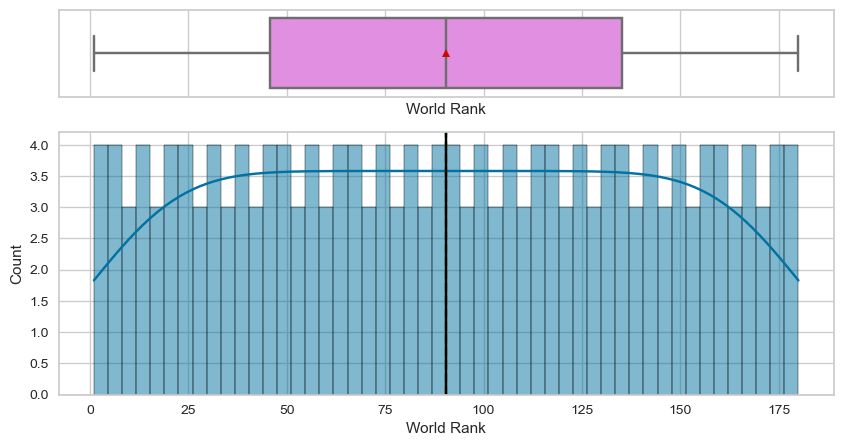

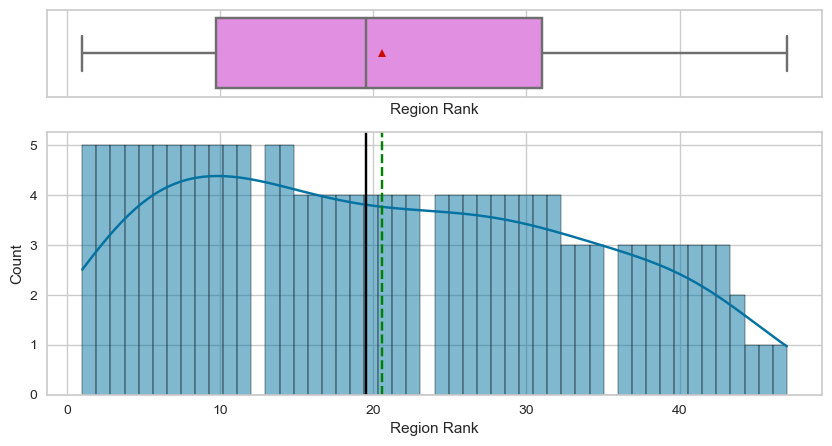

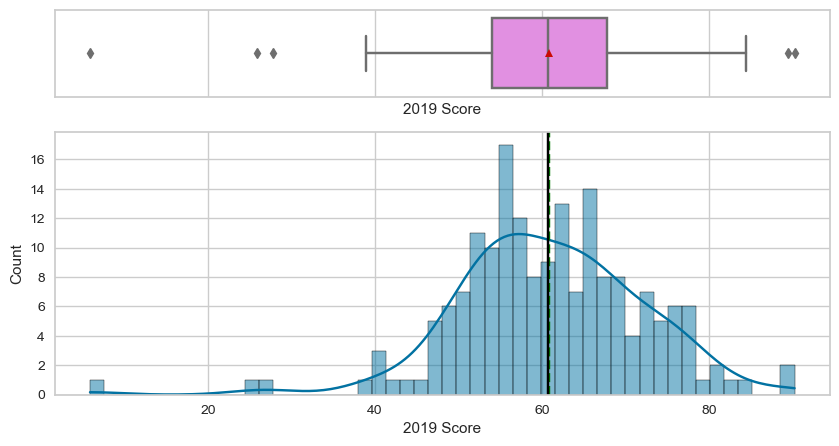

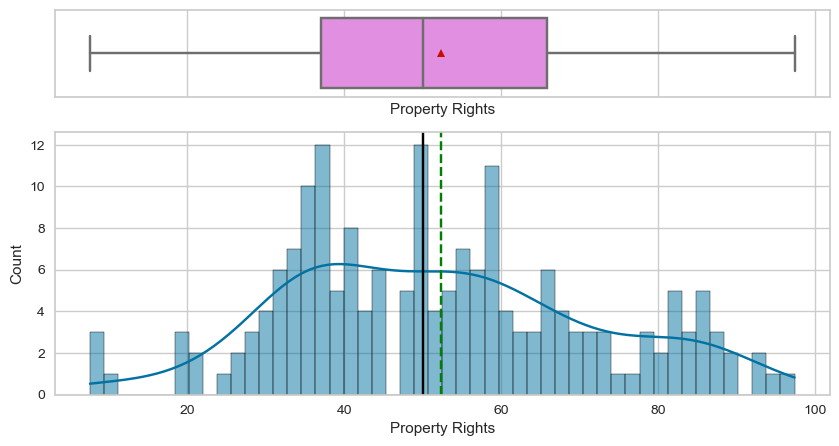

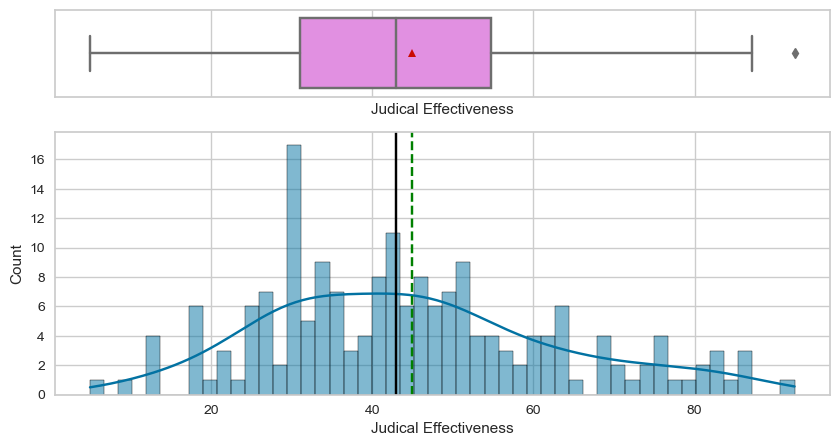

...

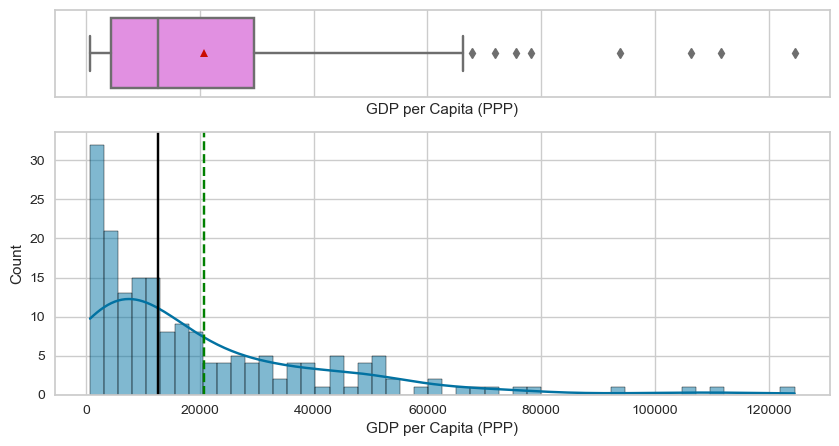

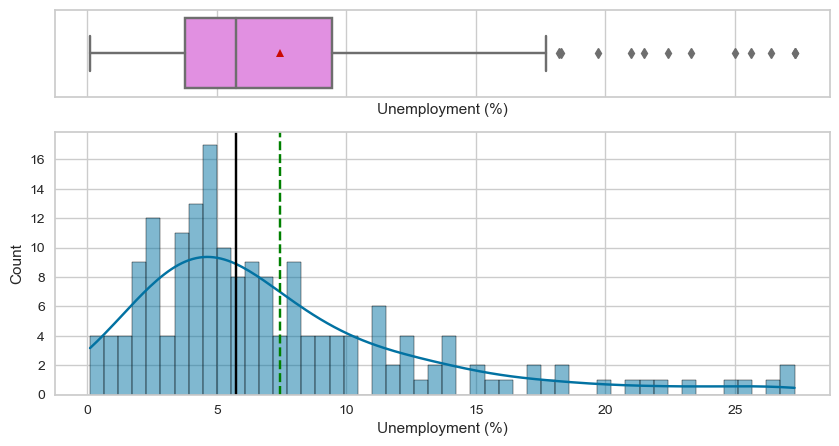

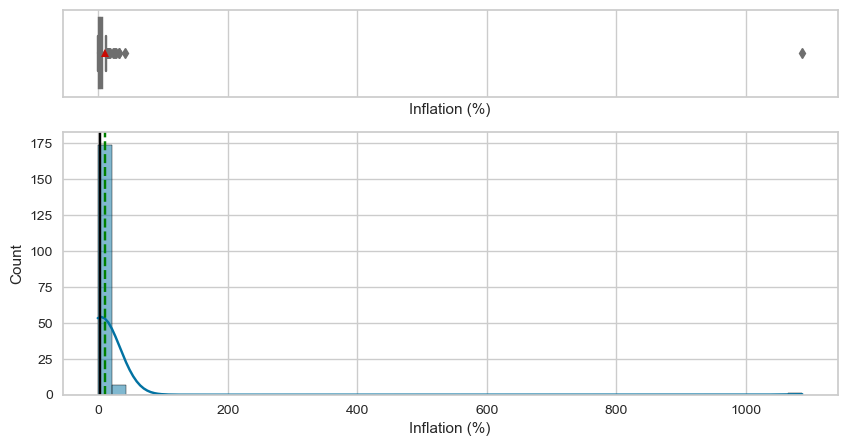

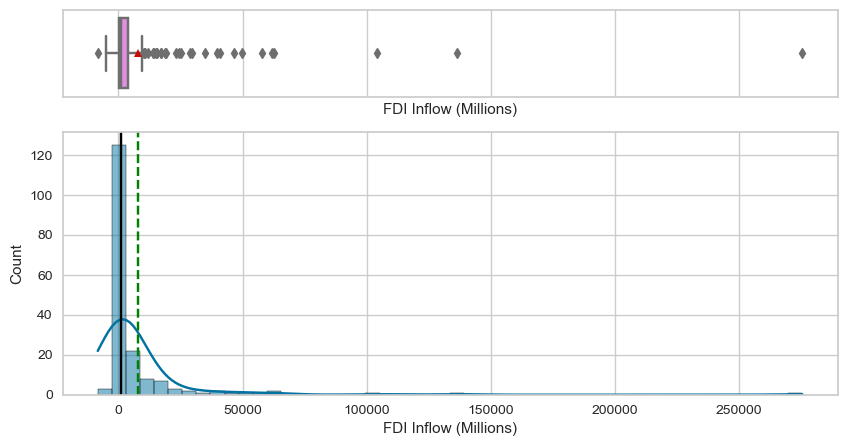

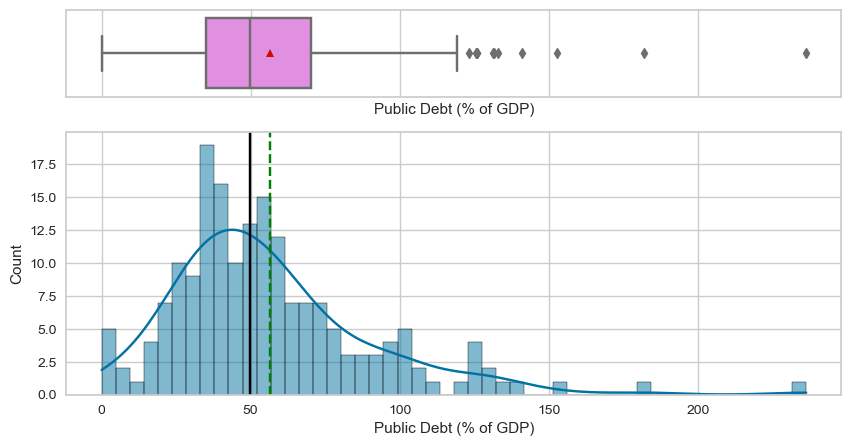

<IPython.core.display.Javascript object>

In [51]:
# selecting numerical columns
num_cols = df.select_dtypes(include=np.number).columns.tolist()

for item in num_cols:
    histogram_boxplot(df, item, bins=50, kde=True, figsize=(10, 5))

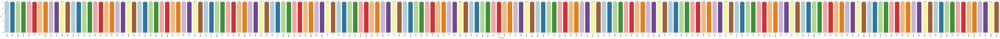

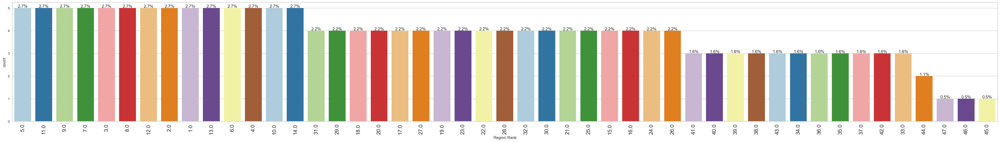

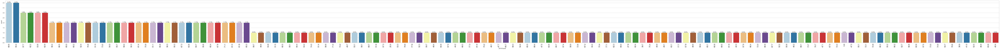

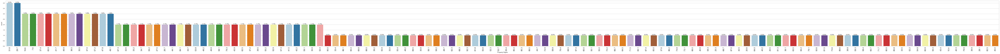

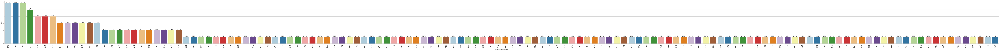

...

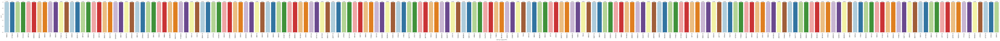

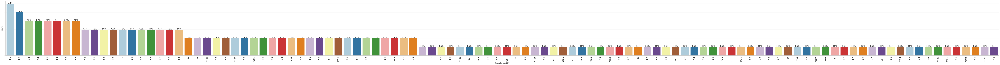

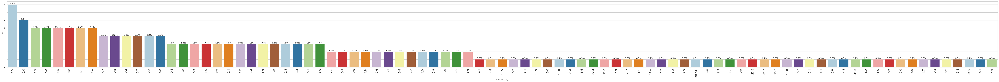

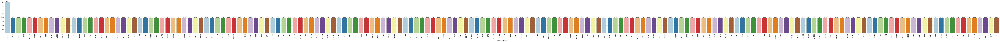

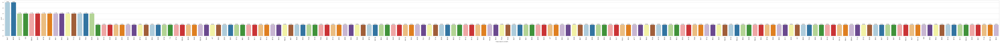

<IPython.core.display.Javascript object>

In [52]:
# selecting numerical columns
num_cols = df.select_dtypes(include=np.number).columns.tolist()

for item in num_cols:
    labeled_barplot(df, item, perc=True)

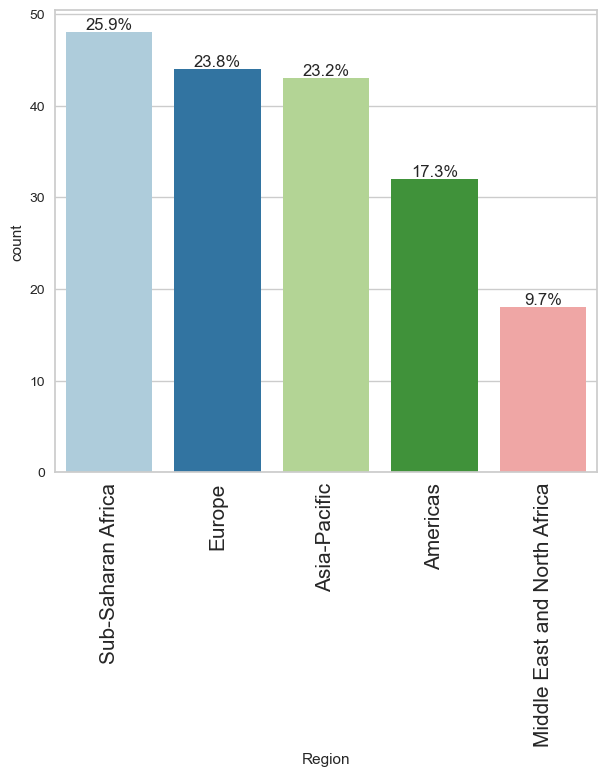

<IPython.core.display.Javascript object>

In [53]:
labeled_barplot(df, "Region", perc=True)

**Inferences**

* 2019 Score, Tax Burden, Govt Spending, Fiscal Health, Business Freedom, Labor Freedom, Monetary Freedom, Trade Freedom, Investment Freedom, Income Tax Rate (%), 5 Year GDP Growth Rate (%) are left skewed
* Government Integrity, Tariff rate (%), Tax Burden (%), Govt Expenditure, GDP per Capita (PPP), Public Debt (%) are Right skewed
* Quite a few columns are having normal distribution.
* The mean values for most of the indicators fall in the middle of the range, indicating a fairly uniform distribution of data.
* The standard deviations for some of the indicators, such as inflation and public debt, are quite high, indicating a significant amount of variability in the data.
* 'Americas' region has 32 countries.'Asia-Pacific' region has 43 countries. 'Europe' region has 44 countries. 'Middle East and North Africa' region has 18 countries. Sub-Saharan Africa' region has 48.

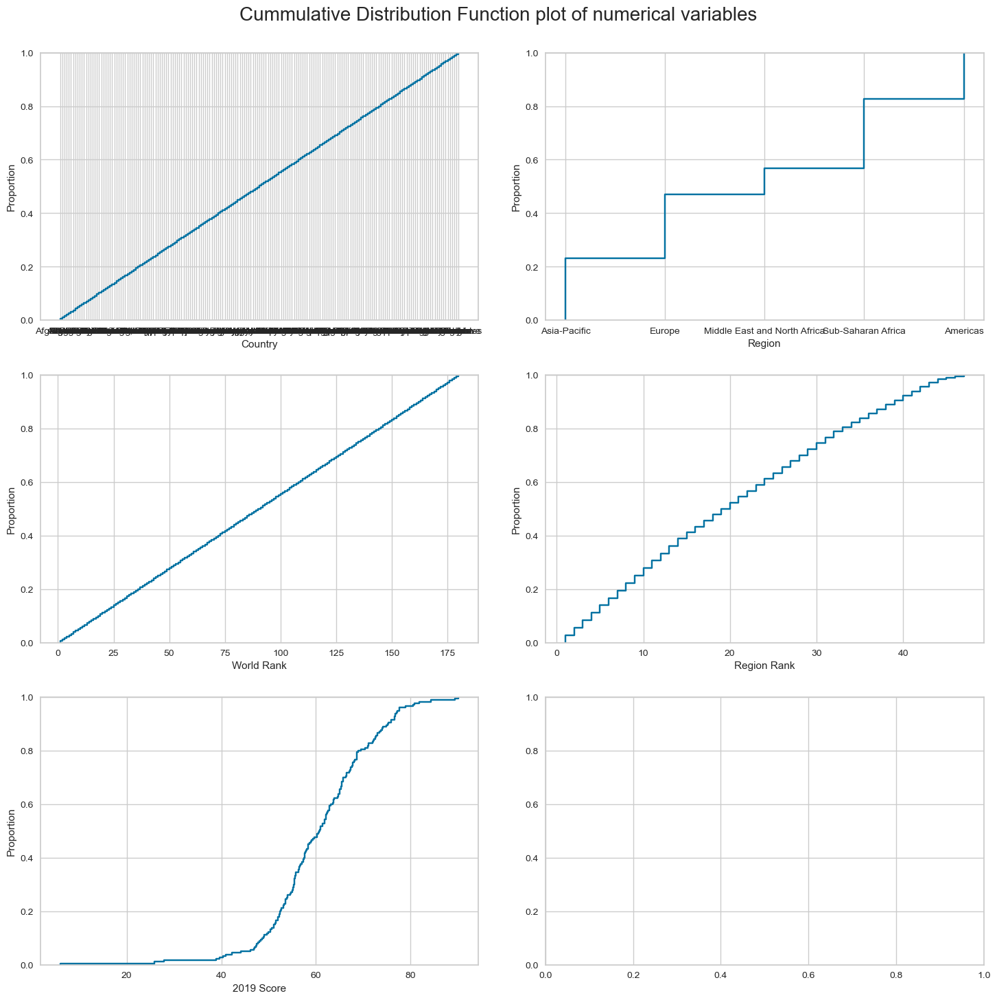

<IPython.core.display.Javascript object>

In [54]:
fig, axes = plt.subplots(3, 2, figsize=(15, 15))
fig.suptitle(
    "Cummulative Distribution Function plot of numerical variables", fontsize=20
)

counter = 0

for ii in range(3):
    sns.ecdfplot(data=df, ax=axes[ii][0], x=df.columns.tolist()[counter])
    counter = counter + 1
    if counter != 5:
        sns.ecdfplot(data=df, ax=axes[ii][1], x=df.columns.tolist()[counter])
        counter = counter + 1
    else:
        pass

fig.tight_layout(pad=2.0)

## Bivariate Analysis

**correlation**

In [55]:
df.corr()

,World Rank,Region Rank,2019 Score,Property Rights,Judical Effectiveness,Government Integrity,Tax Burden,Govt Spending,Fiscal Health,Business Freedom,Labor Freedom,Monetary Freedom,Trade Freedom,Investment Freedom,Financial Freedom,Tariff Rate (%),Income Tax Rate (%),Corporate Tax Rate (%),Tax Burden % of GDP,Govt Expenditure % of GDP,Population (Millions),"GDP (Billions, PPP)",GDP Growth Rate (%),5 Year GDP Growth Rate (%),GDP per Capita (PPP),Unemployment (%),Inflation (%),FDI Inflow (Millions),Public Debt (% of GDP)
World Rank,1.000000,0.737060,-0.938328,-0.862262,-0.783510,-0.777058,0.001651,0.061147,-0.552224,-0.767427,-0.500242,-0.511640,-0.698677,-0.750002,-0.782137,0.546004,-0.027692,0.333975,-0.356061,-0.005270,0.048519,-0.118058,-0.108975,0.004356,-0.640095,0.061759,0.158491,-0.247852,0.024561
Region Rank,0.737060,1.000000,-0.713517,-0.567211,-0.606432,-0.578832,-0.092319,-0.200618,-0.308334,-0.542479,-0.438888,-0.365277,-0.446179,-0.545998,-0.594273,0.326258,-0.028547,0.138492,0.002812,0.209026,0.026493,-0.090019,-0.056843,-0.095489,-0.454021,0.093658,0.087730,-0.197114,0.077280
2019 Score,-0.938328,-0.713517,1.000000,0.830409,0.804253,0.763715,0.137279,0.045461,0.563171,0.812523,0.579635,0.645076,0.753086,0.754252,0.790032,-0.636272,0.009201,-0.327574,0.298399,-0.129428,-0.034529,0.113800,0.188446,0.063560,0.614674,-0.058689,-0.276533,0.278234,-0.036412
Property Rights,-0.862262,-0.567211,0.830409,1.000000,0.822445,0.855428,-0.153225,-0.235260,0.350158,0.776943,0.429934,0.474246,0.649216,0.665051,0.727224,-0.492647,0.155824,-0.297578,0.485731,0.098852,0.010460,0.165789,-0.074934,0.071906,0.687972,-0.117543,-0.198389,0.304609,0.096942
Judical Effectiveness,-0.783510,-0.606432,0.804253,0.822445,1.000000,0.878679,-0.113761,-0.135135,0.335370,0.726369,0.458986,0.438477,0.566233,0.553842,0.608063,-0.442519,0.182569,-0.216257,0.358283,0.032583,0.150327,0.285785,-0.022751,0.028141,0.638513,-0.040234,-0.155026,0.373212,0.074158
Government Integrity,-0.777058,-0.578832,0.763715,0.855428,0.878679,1.000000,-0.218628,-0.302520,0.315531,0.719176,0.411632,0.415216,0.543947,0.583810,0.625537,-0.403071,0.225080,-0.252158,0.421746,0.167446,0.028945,0.194943,-0.064211,0.013631,0.705189,-0.096809,-0.152093,0.333734,0.103467
Tax Burden,0.001651,-0.092319,0.137279,-0.153225,-0.113761,-0.218628,1.000000,0.393912,0.016279,0.093128,0.257248,0.127431,0.177123,-0.118439,-0.051673,-0.265821,-0.898048,-0.555456,-0.588508,-0.403075,-0.033080,-0.080142,0.153649,0.209151,-0.053542,-0.106212,-0.010373,-0.080756,-0.237029
Govt Spending,0.061147,-0.200618,0.045461,-0.235260,-0.135135,-0.302520,0.393912,1.000000,0.082900,-0.145194,0.055310,-0.010335,-0.131526,-0.087702,-0.131152,0.078780,-0.075622,0.216163,-0.654658,-0.887607,0.090773,-0.018450,-0.050105,0.293019,-0.255897,-0.135506,-0.007844,-0.028980,-0.076822
Fiscal Health,-0.552224,-0.308334,0.563171,0.350158,0.335370,0.315531,0.016279,0.082900,1.000000,0.343510,0.180739,0.321455,0.312958,0.280447,0.260901,-0.268554,0.075790,-0.063895,0.154495,-0.141536,-0.071575,-0.013833,0.046226,0.179097,0.242836,-0.133771,-0.127881,0.041619,-0.313850
Business Freedom,-0.767427,-0.542479,0.812523,0.776943,0.726369,0.719176,0.093128,-0.145194,0.343510,1.000000,0.514902,0.484030,0.655377,0.573500,0.620251,-0.550077,0.000347,-0.344350,0.389648,0.002019,-0.031849,0.122121,-0.054175,0.034833,0.537759,0.009397,-0.170139,0.233246,0.054894


<IPython.core.display.Javascript object>

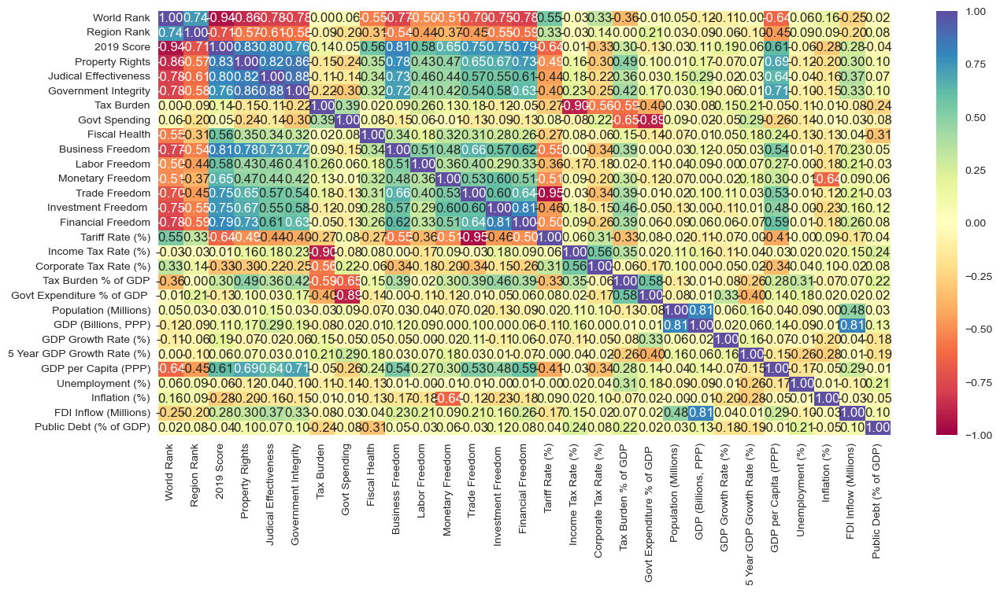

<IPython.core.display.Javascript object>

In [56]:
plt.figure(figsize=(15, 7))
sns.heatmap(df.corr(), annot=True, vmin=-1, vmax=1, fmt=".2f", cmap="Spectral")
plt.show()

**Columns with > 0.85 and < -0.85 correlation** 

* 2019 score with World Rank
* Property Rights with World Rank
* Tax Burden with Income Tax Rate (%)
* Trade Freeedom with Tarrif Rate (%) 
* Govt Spending with Govt Expenditure (%) of GDP

To aviod multi colinearity these columns will be dropped

In [57]:
df.drop(
    ["2019 Score", "Property Rights", "Tax Burden", "Trade Freedom", "Govt Spending"],
    axis=1,
    inplace=True,
)

<IPython.core.display.Javascript object>

**Pairplots**

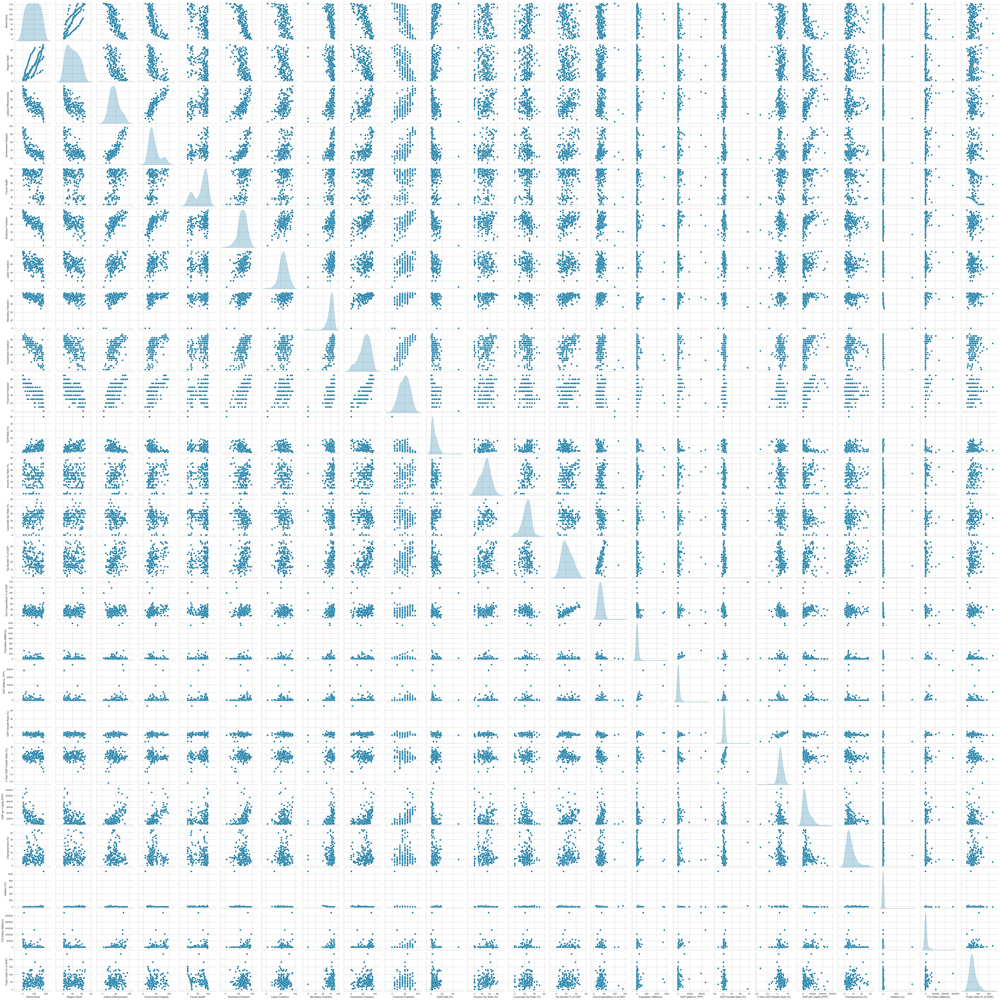

<IPython.core.display.Javascript object>

In [58]:
sns.pairplot(data=df, diag_kind="kde")
plt.show()

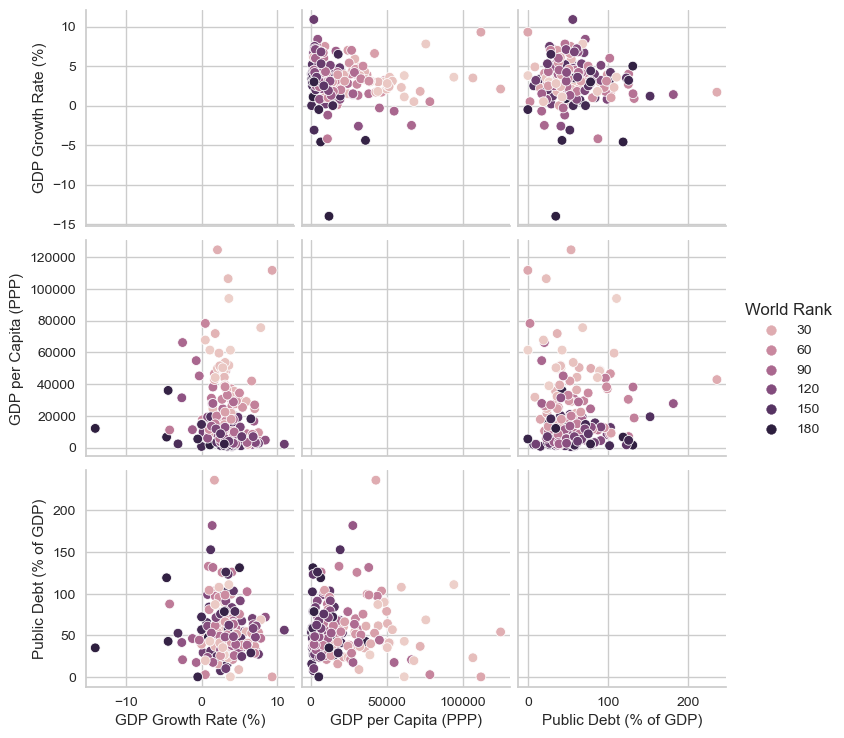

<IPython.core.display.Javascript object>

In [59]:
sns.pairplot(
    data=df[
        [
            "World Rank",
            "GDP Growth Rate (%)",
            "GDP per Capita (PPP)",
            "Public Debt (% of GDP)",
        ]
    ],
    hue="World Rank",
)

plt.show()

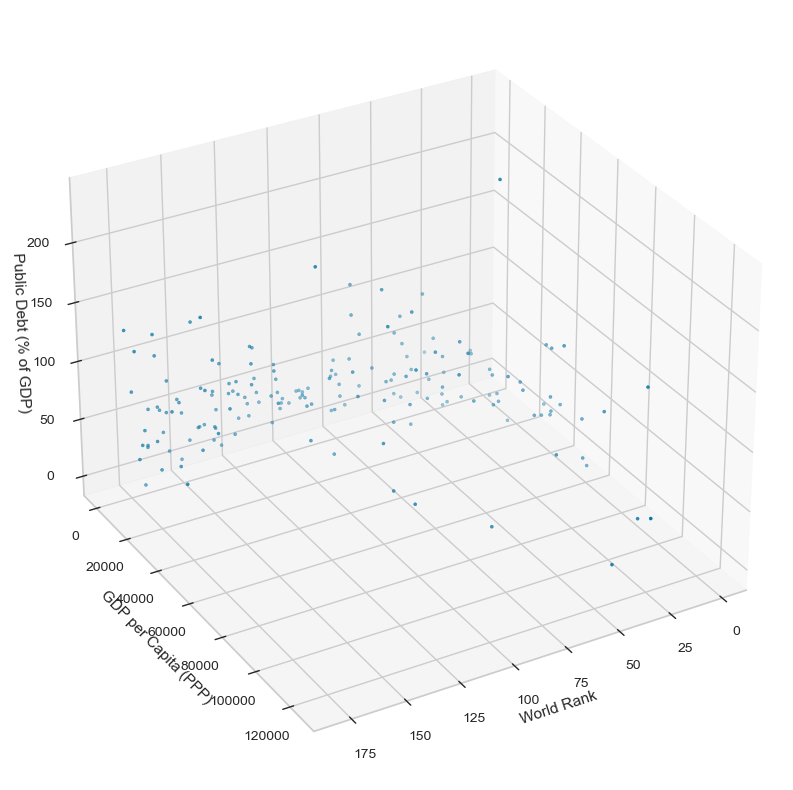

<IPython.core.display.Javascript object>

In [60]:
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(10, 10))
ax = plt.axes(projection="3d")

x = df["World Rank"]
y = df["GDP per Capita (PPP)"]
z = df["Public Debt (% of GDP)"]


ax.scatter(x, y, z, marker=".")
ax.set_xlabel("World Rank")
ax.set_ylabel("GDP per Capita (PPP)")
ax.set_zlabel("Public Debt (% of GDP)")
ax.view_init(azim=60)
plt.show()

**Inferences**

* With higher GDP per Capita (PPP) the World Rank trends lower. 
* GDP Growth Rate (%) has a -negative but NOT strong corelation with World Rank. 
* Public debt (% of GDP) doesn't have a strong co relation with World Rank. 

## Data Preprocessing

### Missing Value Treatment

In [61]:
data.isnull().sum().sort_values(ascending=False)

Tax Burden % of GDP            7
Tax Burden                     6
World Rank                     6
Region Rank                    6
2019 Score                     6
FDI Inflow (Millions)          5
Financial Freedom              5
Unemployment (%)               5
Gov't Expenditure % of GDP     4
Trade Freedom                  4
Public Debt (% of GDP)         4
Inflation (%)                  4
Tariff Rate (%)                4
Gov't Spending                 3
Fiscal Health                  3
Income Tax Rate (%)            3
5 Year GDP Growth Rate (%)     3
Corporate Tax Rate (%)         3
GDP Growth Rate (%)            2
GDP per Capita (PPP)           2
Investment Freedom             2
Monetary Freedom               2
Labor Freedom                  2
GDP (Billions, PPP)            1
Business Freedom               1
Government Integrity           1
Judical Effectiveness          1
Property Rights                1
Country Name                   0
Country                        0
Population

<IPython.core.display.Javascript object>

In [62]:
# let's check for missing values in the data
round(data.isnull().sum() / data.isnull().count() * 100, 2)

CountryID                      0.00
Country Name                   0.00
WEBNAME                        0.00
Region                         0.00
World Rank                     3.23
Region Rank                    3.23
2019 Score                     3.23
Property Rights                0.54
Judical Effectiveness          0.54
Government Integrity           0.54
Tax Burden                     3.23
Gov't Spending                 1.61
Fiscal Health                  1.61
Business Freedom               0.54
Labor Freedom                  1.08
Monetary Freedom               1.08
Trade Freedom                  2.15
Investment Freedom             1.08
Financial Freedom              2.69
Tariff Rate (%)                2.15
Income Tax Rate (%)            1.61
Corporate Tax Rate (%)         1.61
Tax Burden % of GDP            3.76
Gov't Expenditure % of GDP     2.15
Country                        0.00
Population (Millions)          0.00
GDP (Billions, PPP)            0.54
GDP Growth Rate (%)         

<IPython.core.display.Javascript object>

**Treating missing values with means from Region**

In [63]:
for col in df.iloc[:, 2:].columns.tolist():
    df[col] = df.groupby(["Region"])[col].transform(lambda x: x.fillna(x.median()))

# checking for missing values
df.isna().sum()

Country                       0
Region                        0
World Rank                    0
Region Rank                   0
Judical Effectiveness         0
Government Integrity          0
Fiscal Health                 0
Business Freedom              0
Labor Freedom                 0
Monetary Freedom              0
Investment Freedom            0
Financial Freedom             0
Tariff Rate (%)               0
Income Tax Rate (%)           0
Corporate Tax Rate (%)        0
Tax Burden % of GDP           0
Govt Expenditure % of GDP     0
Population (Millions)         0
GDP (Billions, PPP)           0
GDP Growth Rate (%)           0
5 Year GDP Growth Rate (%)    0
GDP per Capita (PPP)          0
Unemployment (%)              0
Inflation (%)                 0
FDI Inflow (Millions)         0
Public Debt (% of GDP)        0
dtype: int64

<IPython.core.display.Javascript object>

### Outlier detection

In [64]:
threshold = 3
outlier = {}
num_cols = df.select_dtypes(include=np.number).columns.tolist()
for col in num_cols:
    i = df[col]
    mean = np.mean(df[col])
    std = np.std(df[col])
    list1 = []
    for v in i:
        z = (v - mean) / std
        if z > threshold:
            list1.append(v)
    list1.sort()
    outlier[i.name] = list1

print("The following are the outliers in the data:")
for key, value in outlier.items():
    print("\n", key, ":", value)

The following are the outliers in the data:

 World Rank : []

 Region Rank : []

 Judical Effectiveness : []

 Government Integrity : []

 Fiscal Health : []

 Business Freedom : []

 Labor Freedom : []

 Monetary Freedom : []

 Investment Freedom  : []

 Financial Freedom : []

 Tariff Rate (%) : [50.0]

 Income Tax Rate (%) : []

 Corporate Tax Rate (%) : []

 Tax Burden % of GDP : []

 Govt Expenditure % of GDP  : [100.0, 117.9, 139.2]

 Population (Millions) : [1316.9, 1390.1]

 GDP (Billions, PPP) : [9459.0, 19390.6, 23159.1]

 GDP Growth Rate (%) : [70.8]

 5 Year GDP Growth Rate (%) : []

 GDP per Capita (PPP) : [93906.0, 106374.0, 111629.0, 124529.0]

 Unemployment (%) : [25.0, 25.6, 26.4, 27.3, 27.3]

 Inflation (%) : [1087.5]

 FDI Inflow (Millions) : [104333.0, 136320.0, 275381.0]

 Public Debt (% of GDP) : [181.9, 236.4]


<IPython.core.display.Javascript object>

## Scaling

In [65]:
sc = StandardScaler()
subset_scaled_df = pd.DataFrame(
    sc.fit_transform(df.drop(["Country", "Region"], axis=1)),
    columns=df.drop(["Country", "Region"], axis=1).columns,
)
subset_scaled_df.head()

,World Rank,Region Rank,Judical Effectiveness,Government Integrity,Fiscal Health,Business Freedom,Labor Freedom,Monetary Freedom,Investment Freedom,Financial Freedom,Tariff Rate (%),Income Tax Rate (%),Corporate Tax Rate (%),Tax Burden % of GDP,Govt Expenditure % of GDP,Population (Millions),"GDP (Billions, PPP)",GDP Growth Rate (%),5 Year GDP Growth Rate (%),GDP per Capita (PPP),Unemployment (%),Inflation (%),FDI Inflow (Millions),Public Debt (% of GDP)
0,1.193634,1.477149,-0.847346,-0.824244,1.059499,-0.908450,0.068473,0.146085,-2.105828,-2.025261,0.185245,-0.623712,-0.452874,-1.669030,-0.538495,-0.032172,-0.257613,-0.165744,-0.030997,-0.837526,0.254568,-0.068703,-0.300952,-1.451377
1,-0.753653,0.530477,-0.791962,-0.054219,0.469344,0.367209,-0.470721,0.576060,0.577834,1.105714,-0.890834,-0.396796,-1.023516,0.301193,-0.283942,-0.257368,-0.271598,0.075423,-0.168759,-0.362311,1.164361,-0.106374,-0.259421,0.438418
2,1.563619,-0.495084,-0.481811,-0.636804,-1.484166,-0.121477,-0.666791,-0.015156,-1.211274,-0.981603,0.513541,0.510868,-0.110489,0.261590,0.492771,0.009275,-0.023165,-0.251875,0.037885,-0.239329,0.468637,-0.061169,-0.256150,-0.904253
3,1.271526,1.003813,-1.013498,-1.062344,-0.237580,-0.495924,-0.043567,-1.761928,-1.211274,-0.459774,0.622973,-0.850628,0.688411,-0.124534,-0.558076,-0.082599,-0.207377,-0.475816,-0.030997,-0.621519,0.147534,0.266566,-0.390955,0.263930
4,1.115743,0.451588,-0.022124,-0.403770,-1.032870,-0.451498,-0.876867,-1.331953,-0.093082,0.583884,0.276439,0.510868,0.688411,0.885329,0.466663,0.027236,0.096410,-0.096839,-0.788689,0.014698,0.236729,0.191224,0.159239,-0.111663


<IPython.core.display.Javascript object>

### K-Means Clustering

In [66]:
k_means_df = subset_scaled_df.copy()

<IPython.core.display.Javascript object>

Number of Clusters: 2 	Average Distortion: 3566.2717006785947
Number of Clusters: 3 	Average Distortion: 3285.5390586623494
Number of Clusters: 4 	Average Distortion: 2939.749658199578
Number of Clusters: 5 	Average Distortion: 2679.1354964570005
Number of Clusters: 6 	Average Distortion: 2529.2484569581666
Number of Clusters: 7 	Average Distortion: 2353.3593974907935
Number of Clusters: 8 	Average Distortion: 2184.775203267643
Number of Clusters: 9 	Average Distortion: 2083.635032729136
Number of Clusters: 10 	Average Distortion: 1924.0472654378905


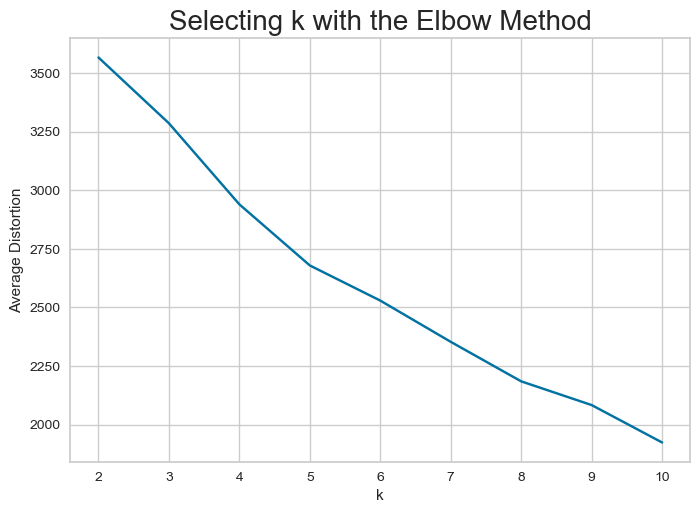

<IPython.core.display.Javascript object>

In [67]:
clusters = range(2, 11)
meanDistortions = []

for k in clusters:
    model = KMeans(n_clusters=k, random_state=1)
    model.fit(subset_scaled_df)
    prediction = model.predict(k_means_df)
    distortion = sum(
        np.min(cdist(k_means_df, model.cluster_centers_, "euclidean"), axis=1) ** 2
    )

    meanDistortions.append(distortion)

    print("Number of Clusters:", k, "\tAverage Distortion:", distortion)

plt.plot(clusters, meanDistortions, "bx-")
plt.xlabel("k")
plt.ylabel("Average Distortion")
plt.title("Selecting k with the Elbow Method", fontsize=20)
plt.show()

**With Elbow method the appropriate value of k doesn't seem to be apparent. Maybe 4 or 5 can be the value of k. We shall do furher investigation**

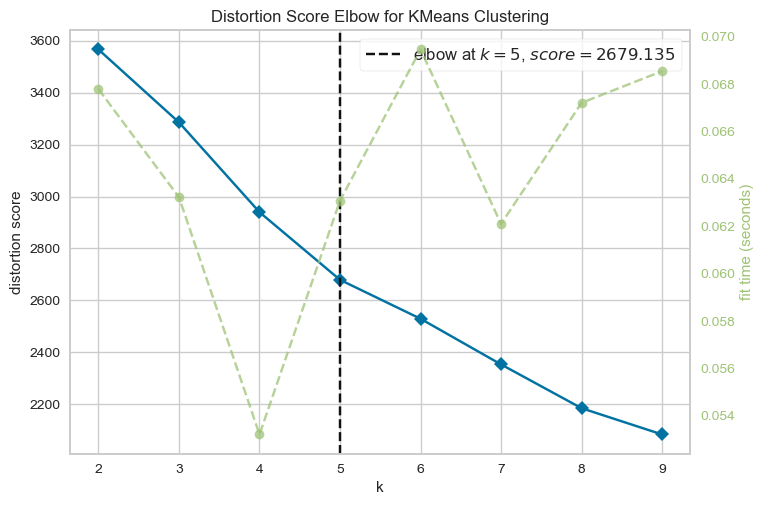

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

<IPython.core.display.Javascript object>

In [68]:
model = KMeans(random_state=1)
visualizer = KElbowVisualizer(model, k=(2, 10), timings=True)
visualizer.fit(k_means_df)  # fit the data to the visualizer
visualizer.show()  # finalize and render figure

**silhouette scores.**

In [69]:
sil_score = []
cluster_list = range(2, 10)
for n_clusters in cluster_list:
    clusterer = KMeans(n_clusters=n_clusters, random_state=1)
    preds = clusterer.fit_predict((subset_scaled_df))
    score = silhouette_score(k_means_df, preds)
    sil_score.append(score)
    print("For n_clusters = {}, the silhouette score is {})".format(n_clusters, score))

For n_clusters = 2, the silhouette score is 0.19530083304628862)
For n_clusters = 3, the silhouette score is 0.13003049950675477)
For n_clusters = 4, the silhouette score is 0.1348088972514258)
For n_clusters = 5, the silhouette score is 0.13938125964520162)
For n_clusters = 6, the silhouette score is 0.12724371944821825)
For n_clusters = 7, the silhouette score is 0.13437555537843865)
For n_clusters = 8, the silhouette score is 0.11338749342337393)
For n_clusters = 9, the silhouette score is 0.10999480758186102)


<IPython.core.display.Javascript object>

**5 and 7 Clusters have a high reasonable Silhouette score**

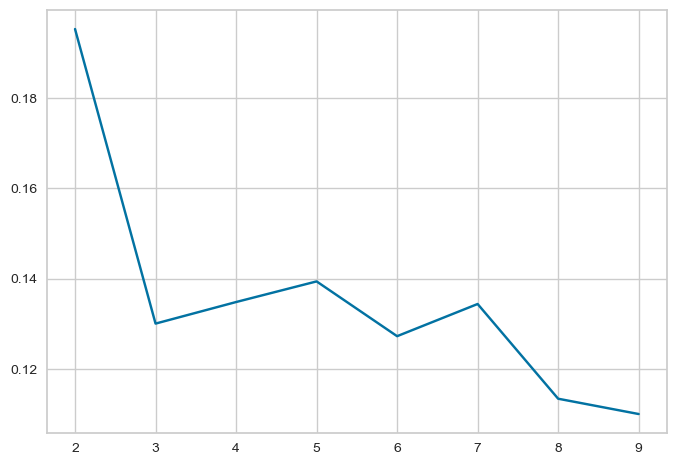

<IPython.core.display.Javascript object>

In [70]:
plt.plot(cluster_list, sil_score)
plt.show()

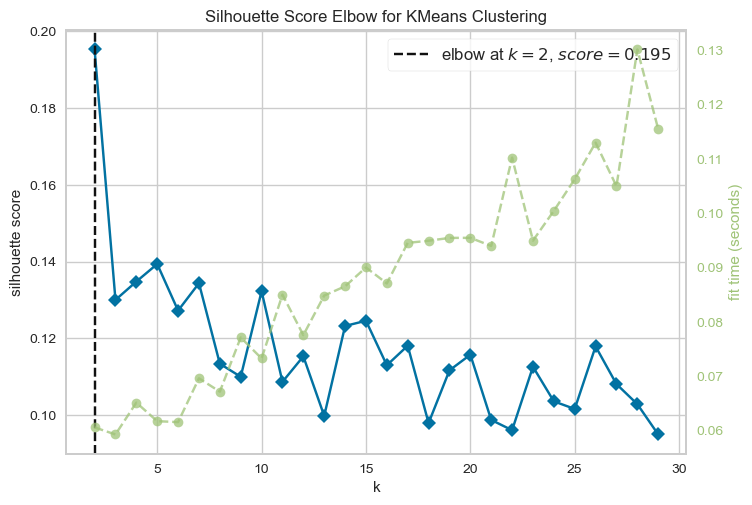

<AxesSubplot:title={'center':'Silhouette Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='silhouette score'>

<IPython.core.display.Javascript object>

In [71]:
model = KMeans(random_state=1)
visualizer = KElbowVisualizer(model, k=(2, 30), metric="silhouette", timings=True)
visualizer.fit(k_means_df)  # fit the data to the visualizer
visualizer.show()  # finalize and render figure

**From the silhouette scores, it seems that 5,6 or 7 is a good value for k. At K =2 there will be too many countries in each cluster**

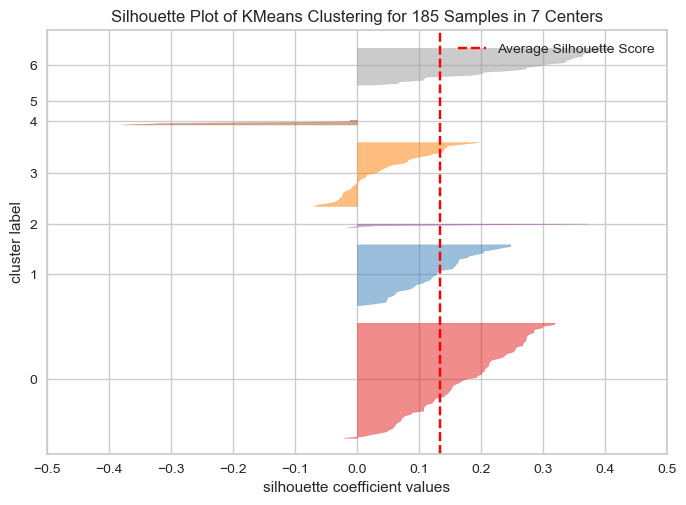

<AxesSubplot:title={'center':'Silhouette Plot of KMeans Clustering for 185 Samples in 7 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

<IPython.core.display.Javascript object>

In [72]:
# finding optimal no. of clusters with silhouette coefficients
visualizer = SilhouetteVisualizer(KMeans(7, random_state=1))
visualizer.fit(k_means_df)
visualizer.show()

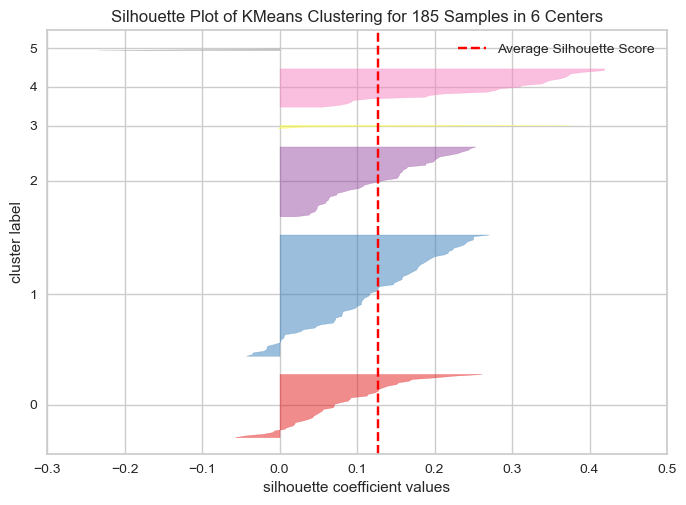

<AxesSubplot:title={'center':'Silhouette Plot of KMeans Clustering for 185 Samples in 6 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

<IPython.core.display.Javascript object>

In [73]:
# finding optimal no. of clusters with silhouette coefficients
visualizer = SilhouetteVisualizer(KMeans(6, random_state=1))
visualizer.fit(k_means_df)
visualizer.show()

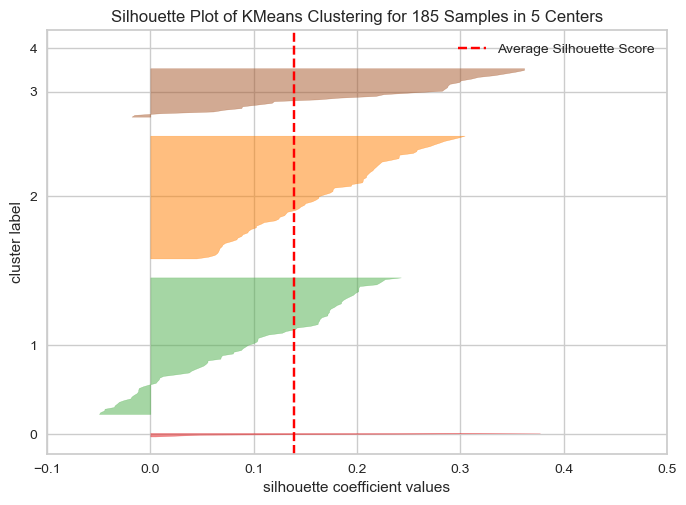

<AxesSubplot:title={'center':'Silhouette Plot of KMeans Clustering for 185 Samples in 5 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

<IPython.core.display.Javascript object>

In [74]:
# finding optimal no. of clusters with silhouette coefficients
visualizer = SilhouetteVisualizer(KMeans(5, random_state=1))
visualizer.fit(k_means_df)
visualizer.show()

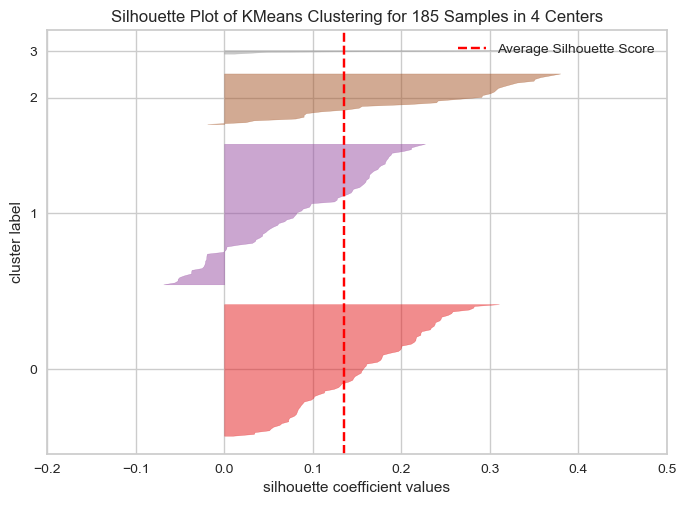

<AxesSubplot:title={'center':'Silhouette Plot of KMeans Clustering for 185 Samples in 4 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

<IPython.core.display.Javascript object>

In [75]:
# finding optimal no. of clusters with silhouette coefficients
visualizer = SilhouetteVisualizer(KMeans(4, random_state=1))
visualizer.fit(k_means_df)
visualizer.show()

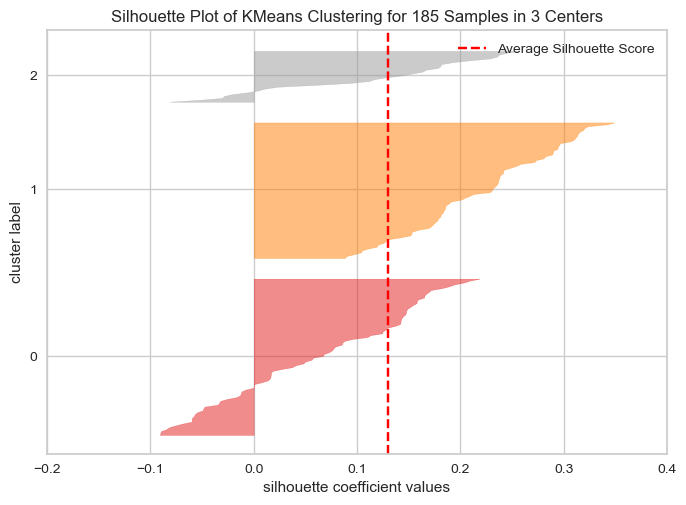

<AxesSubplot:title={'center':'Silhouette Plot of KMeans Clustering for 185 Samples in 3 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

<IPython.core.display.Javascript object>

In [76]:
# finding optimal no. of clusters with silhouette coefficients
visualizer = SilhouetteVisualizer(KMeans(3, random_state=1))
visualizer.fit(k_means_df)
visualizer.show()

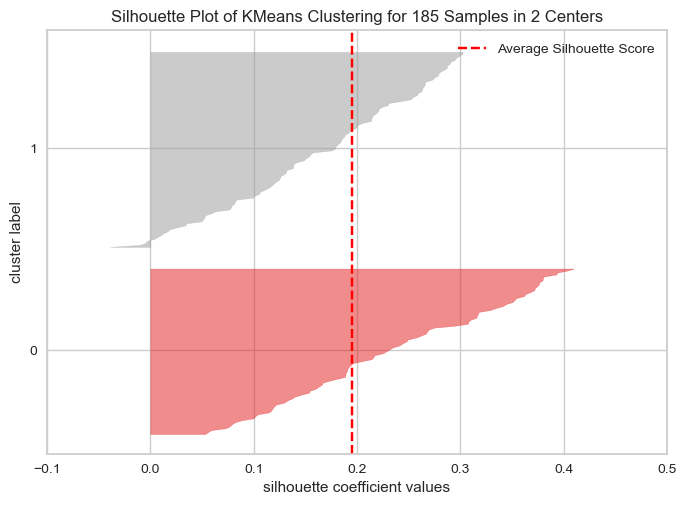

<AxesSubplot:title={'center':'Silhouette Plot of KMeans Clustering for 185 Samples in 2 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

<IPython.core.display.Javascript object>

In [77]:
# finding optimal no. of clusters with silhouette coefficients
visualizer = SilhouetteVisualizer(KMeans(2, random_state=1))
visualizer.fit(k_means_df)
visualizer.show()

**Inferences**
- The silhouette coefficient for 5 clusters is the highest but We shall go with 6 clusters. The 6 clusters silhouette coefficient is close to the average score and the shape of the clusters is very uniform in SilhouetteVisualizer, even though the magnitude may be different.
- So, we will proceed with 6 clusters.

In [78]:
%%time
kmeans = KMeans(n_clusters=6, random_state=0)
kmeans.fit(k_means_df)

Wall time: 74 ms


KMeans(n_clusters=6, random_state=0)

<IPython.core.display.Javascript object>

In [79]:
# creating a copy of the original data
df1 = df.copy()

# adding kmeans cluster labels to the original and scaled dataframes
k_means_df["K_means_segments"] = kmeans.labels_
df1["K_means_segments"] = kmeans.labels_

<IPython.core.display.Javascript object>

## Hierarchical Clustering

In [80]:
hc_df = subset_scaled_df.copy()

<IPython.core.display.Javascript object>

### Cophenectic Correlation

In [81]:
# list of distance metrics
distance_metrics = ["euclidean", "chebyshev", "mahalanobis", "cityblock"]

# list of linkage methods
linkage_methods = ["single", "complete", "average", "weighted"]

high_cophenet_corr = 0
high_dm_lm = [0, 0]

for dm in distance_metrics:
    for lm in linkage_methods:
        Z = linkage(subset_scaled_df, metric=dm, method=lm)
        c, coph_dists = cophenet(Z, pdist(subset_scaled_df))
        print(
            "Cophenetic correlation for {} distance and {} linkage is {}.".format(
                dm.capitalize(), lm, c
            )
        )
        if high_cophenet_corr < c:
            high_cophenet_corr = c
            high_dm_lm[0] = dm
            high_dm_lm[1] = lm

Cophenetic correlation for Euclidean distance and single linkage is 0.8580916254924291.
Cophenetic correlation for Euclidean distance and complete linkage is 0.746179317946183.
Cophenetic correlation for Euclidean distance and average linkage is 0.8960301736318227.
Cophenetic correlation for Euclidean distance and weighted linkage is 0.8549283074483561.
Cophenetic correlation for Chebyshev distance and single linkage is 0.8407974197552346.
Cophenetic correlation for Chebyshev distance and complete linkage is 0.7984140582993174.
Cophenetic correlation for Chebyshev distance and average linkage is 0.8746095773674966.
Cophenetic correlation for Chebyshev distance and weighted linkage is 0.870319016695923.
Cophenetic correlation for Mahalanobis distance and single linkage is 0.8582628584350219.
Cophenetic correlation for Mahalanobis distance and complete linkage is 0.7646879801571137.
Cophenetic correlation for Mahalanobis distance and average linkage is 0.8569955998635664.
Cophenetic corr

<IPython.core.display.Javascript object>

In [82]:
# printing the combination of distance metric and linkage method with the highest cophenetic correlation
print(
    "Highest cophenetic correlation is {}, which is obtained with {} distance and {} linkage.".format(
        high_cophenet_corr, high_dm_lm[0].capitalize(), high_dm_lm[1]
    )
)

Highest cophenetic correlation is 0.8960301736318227, which is obtained with Euclidean distance and average linkage.


<IPython.core.display.Javascript object>

**Different linkage methods with Euclidean distance only.**

In [83]:
# list of linkage methods
linkage_methods = ["single", "complete", "average", "centroid", "ward", "weighted"]

high_cophenet_corr = 0
high_dm_lm = [0, 0]

for lm in linkage_methods:
    Z = linkage(subset_scaled_df, metric="euclidean", method=lm)
    c, coph_dists = cophenet(Z, pdist(subset_scaled_df))
    print("Cophenetic correlation for {} linkage is {}.".format(lm, c))
    if high_cophenet_corr < c:
        high_cophenet_corr = c
        high_dm_lm[0] = "euclidean"
        high_dm_lm[1] = lm

Cophenetic correlation for single linkage is 0.8580916254924291.
Cophenetic correlation for complete linkage is 0.746179317946183.
Cophenetic correlation for average linkage is 0.8960301736318227.
Cophenetic correlation for centroid linkage is 0.9024533015407729.
Cophenetic correlation for ward linkage is 0.3407808244026212.
Cophenetic correlation for weighted linkage is 0.8549283074483561.


<IPython.core.display.Javascript object>

In [84]:
# printing the combination of distance metric and linkage method with the highest cophenetic correlation
print(
    "Highest cophenetic correlation is {}, which is obtained with {} linkage.".format(
        high_cophenet_corr, high_dm_lm[1]
    )
)

Highest cophenetic correlation is 0.9024533015407729, which is obtained with centroid linkage.


<IPython.core.display.Javascript object>

**Inferences**
* We see that the cophenetic correlation is maximum with Euclidean distance and centriod linkage.

### Dendograms

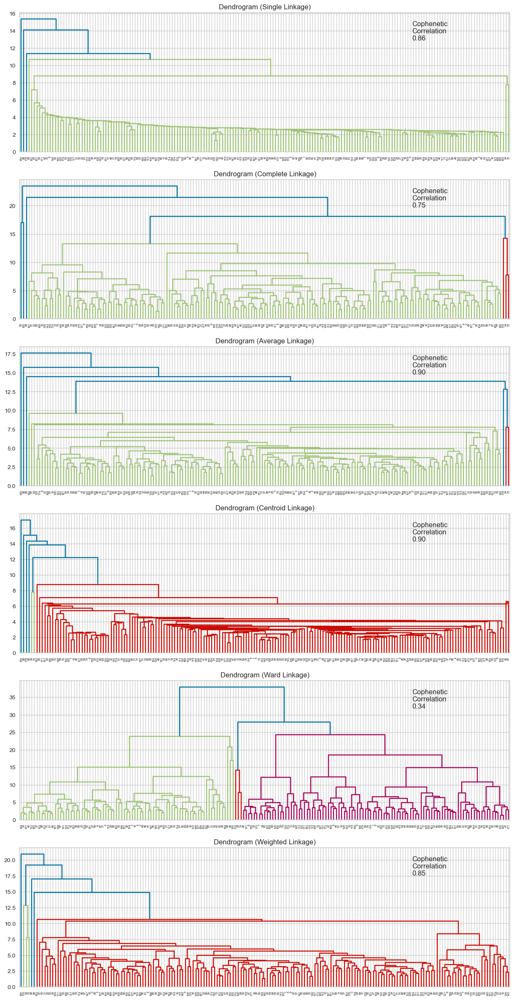

<IPython.core.display.Javascript object>

In [85]:
# list of linkage methods
linkage_methods = ["single", "complete", "average", "centroid", "ward", "weighted"]

# lists to save results of cophenetic correlation calculation
compare_cols = ["Linkage", "Cophenetic Coefficient"]
compare = []

# to create a subplot image
fig, axs = plt.subplots(len(linkage_methods), 1, figsize=(15, 30))

# We will enumerate through the list of linkage methods above
# For each linkage method, we will plot the dendrogram and calculate the cophenetic correlation
for i, method in enumerate(linkage_methods):
    Z = linkage(subset_scaled_df, metric="euclidean", method=method)

    dendrogram(Z, ax=axs[i])
    axs[i].set_title(f"Dendrogram ({method.capitalize()} Linkage)")

    coph_corr, coph_dist = cophenet(Z, pdist(subset_scaled_df))
    axs[i].annotate(
        f"Cophenetic\nCorrelation\n{coph_corr:0.2f}",
        (0.80, 0.80),
        xycoords="axes fraction",
    )

    compare.append([method, coph_corr])

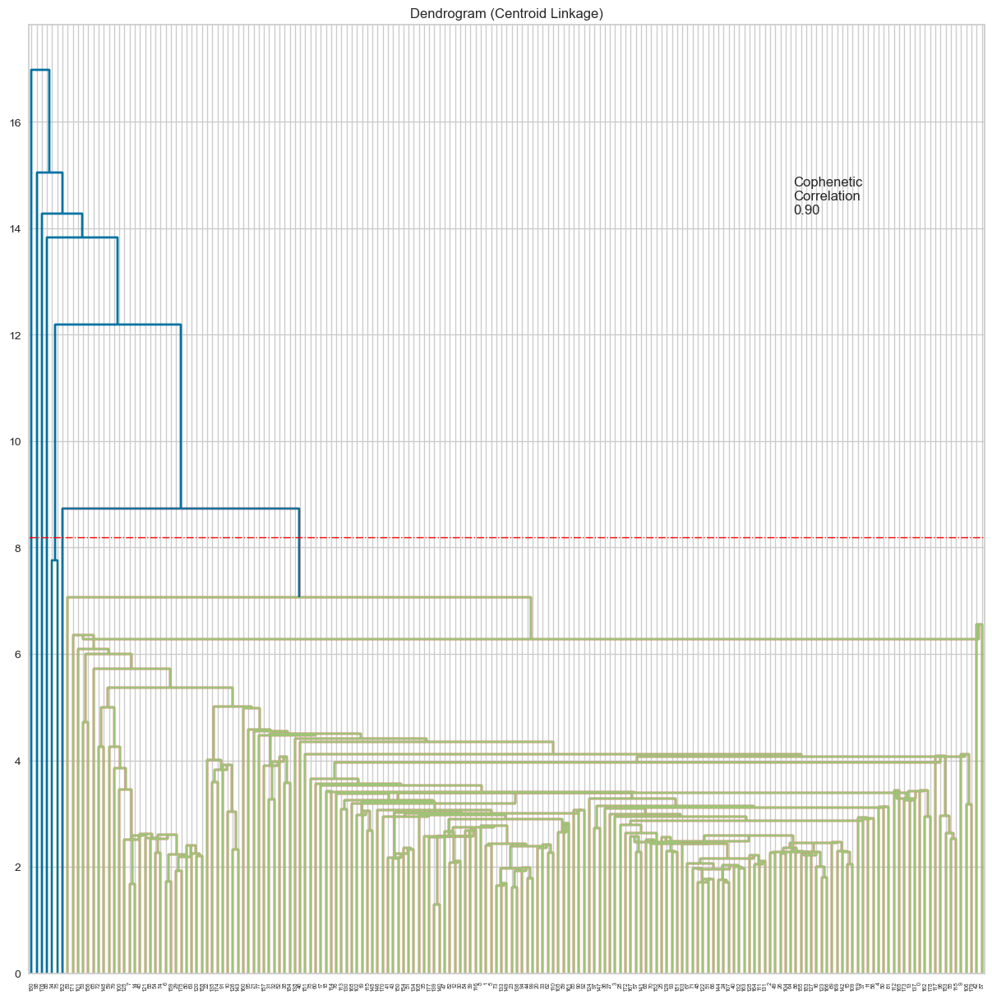

<IPython.core.display.Javascript object>

In [86]:
# list of linkage methods
linkage_methods = ["centroid"]

# lists to save results of cophenetic correlation calculation
compare_cols = ["Linkage", "Cophenetic Coefficient"]

# to create a subplot image
fig, axs = plt.subplots(len(linkage_methods), 1, figsize=(15, 15))

# We will enumerate through the list of linkage methods above
# For each linkage method, we will plot the dendrogram and calculate the cophenetic correlation
for i, method in enumerate(linkage_methods):
    Z = linkage(subset_scaled_df, metric="euclidean", method=method)

    dendrogram(Z, ax=axs)
    axs.set_title(f"Dendrogram ({method.capitalize()} Linkage)")

    coph_corr, coph_dist = cophenet(Z, pdist(subset_scaled_df))
    axs.annotate(
        f"Cophenetic\nCorrelation\n{coph_corr:0.2f}",
        (0.80, 0.80),
        xycoords="axes fraction",
    )
dendrogram(Z, color_threshold=7.3)
plt.axhline(y=8.2, c="red", lw=1, linestyle="dashdot")

**Dendrogram with average linkage shows distinct and separate cluster tree.**

In [87]:
# create and print a dataframe to compare cophenetic correlations for different linkage methods
df_cc = pd.DataFrame(compare, columns=compare_cols)
df_cc = df_cc.sort_values(by="Cophenetic Coefficient")
df_cc

,Linkage,Cophenetic Coefficient
4,ward,0.340781
1,complete,0.746179
5,weighted,0.854928
0,single,0.858092
2,average,0.896030
3,centroid,0.902453


<IPython.core.display.Javascript object>

### check silhouette score

In [88]:
sil_score_hc = []
cluster_list = list(range(2, 10))
for n_clusters in cluster_list:
    clusterer = AgglomerativeClustering(n_clusters=n_clusters)
    preds = clusterer.fit_predict((subset_scaled_df))
    score = silhouette_score(hc_df, preds)
    sil_score_hc.append(score)
    print("For n_clusters = {}, silhouette score is {}".format(n_clusters, score))

For n_clusters = 2, silhouette score is 0.16443937737976835
For n_clusters = 3, silhouette score is 0.17464375973853452
For n_clusters = 4, silhouette score is 0.12790937331794203
For n_clusters = 5, silhouette score is 0.13714487322624874
For n_clusters = 6, silhouette score is 0.1390784754030622
For n_clusters = 7, silhouette score is 0.13349689800714218
For n_clusters = 8, silhouette score is 0.13483937062890608
For n_clusters = 9, silhouette score is 0.10195785522310614


<IPython.core.display.Javascript object>

**Inferences**

* From the silhouette scores, it seems that 6 is a good value for k.
* Let's move ahead with 6 clusters, Euclidean distance, and average linkage.**

In [89]:
%%time
HCmodel = AgglomerativeClustering(n_clusters=6, affinity="euclidean", linkage="average")
HCmodel.fit(hc_df)

Wall time: 7.81 ms


AgglomerativeClustering(linkage='average', n_clusters=6)

<IPython.core.display.Javascript object>

In [90]:
# creating a copy of the original data
df2 = df.copy()

# adding hierarchical cluster labels to the original and scaled dataframes
hc_df["HC_segments"] = HCmodel.labels_
df2["HC_segments"] = HCmodel.labels_

<IPython.core.display.Javascript object>

In [91]:
hc_df.head()

,World Rank,Region Rank,Judical Effectiveness,Government Integrity,Fiscal Health,Business Freedom,Labor Freedom,Monetary Freedom,Investment Freedom,Financial Freedom,Tariff Rate (%),Income Tax Rate (%),Corporate Tax Rate (%),Tax Burden % of GDP,Govt Expenditure % of GDP,Population (Millions),"GDP (Billions, PPP)",GDP Growth Rate (%),5 Year GDP Growth Rate (%),GDP per Capita (PPP),Unemployment (%),Inflation (%),FDI Inflow (Millions),Public Debt (% of GDP),HC_segments
0,1.193634,1.477149,-0.847346,-0.824244,1.059499,-0.908450,0.068473,0.146085,-2.105828,-2.025261,0.185245,-0.623712,-0.452874,-1.669030,-0.538495,-0.032172,-0.257613,-0.165744,-0.030997,-0.837526,0.254568,-0.068703,-0.300952,-1.451377,0
1,-0.753653,0.530477,-0.791962,-0.054219,0.469344,0.367209,-0.470721,0.576060,0.577834,1.105714,-0.890834,-0.396796,-1.023516,0.301193,-0.283942,-0.257368,-0.271598,0.075423,-0.168759,-0.362311,1.164361,-0.106374,-0.259421,0.438418,0
2,1.563619,-0.495084,-0.481811,-0.636804,-1.484166,-0.121477,-0.666791,-0.015156,-1.211274,-0.981603,0.513541,0.510868,-0.110489,0.261590,0.492771,0.009275,-0.023165,-0.251875,0.037885,-0.239329,0.468637,-0.061169,-0.256150,-0.904253,0
3,1.271526,1.003813,-1.013498,-1.062344,-0.237580,-0.495924,-0.043567,-1.761928,-1.211274,-0.459774,0.622973,-0.850628,0.688411,-0.124534,-0.558076,-0.082599,-0.207377,-0.475816,-0.030997,-0.621519,0.147534,0.266566,-0.390955,0.263930,0
4,1.115743,0.451588,-0.022124,-0.403770,-1.032870,-0.451498,-0.876867,-1.331953,-0.093082,0.583884,0.276439,0.510868,0.688411,0.885329,0.466663,0.027236,0.096410,-0.096839,-0.788689,0.014698,0.236729,0.191224,0.159239,-0.111663,0


<IPython.core.display.Javascript object>

In [92]:
df2.head()

,Country,Region,World Rank,Region Rank,Judical Effectiveness,Government Integrity,Fiscal Health,Business Freedom,Labor Freedom,Monetary Freedom,Investment Freedom,Financial Freedom,Tariff Rate (%),Income Tax Rate (%),Corporate Tax Rate (%),Tax Burden % of GDP,Govt Expenditure % of GDP,Population (Millions),"GDP (Billions, PPP)",GDP Growth Rate (%),5 Year GDP Growth Rate (%),GDP per Capita (PPP),Unemployment (%),Inflation (%),FDI Inflow (Millions),Public Debt (% of GDP),HC_segments
0,Afghanistan,Asia-Pacific,152.0,39.0,29.6,25.2,99.3,49.2,60.4,76.7,10.0,10.0,7.0,20.0,20.0,5.0,25.6,35.5,69.6,2.5,2.9,1958.0,8.8,5.0,53.9,7.3,0
1,Albania,Europe,52.0,27.0,30.6,40.4,80.6,69.3,52.7,81.5,70.0,70.0,1.1,23.0,15.0,24.9,29.5,2.9,36.0,3.9,2.5,12507.0,13.9,2.0,1119.1,71.2,0
2,Algeria,Middle East and North Africa,171.0,14.0,36.2,28.9,18.7,61.6,49.9,74.9,30.0,30.0,8.8,35.0,23.0,24.5,41.4,41.5,632.9,2.0,3.1,15237.0,10.0,5.6,1203.0,25.8,0
3,Angola,Sub-Saharan Africa,156.0,33.0,26.6,20.5,58.2,55.7,58.8,55.4,30.0,40.0,9.4,17.0,30.0,20.6,25.3,28.2,190.3,0.7,2.9,6753.0,8.2,31.7,-2254.5,65.3,0
4,Argentina,Americas,148.0,26.0,44.5,33.5,33.0,56.4,46.9,60.2,55.0,60.0,7.5,35.0,30.0,30.8,41.0,44.1,920.2,2.9,0.7,20876.0,8.7,25.7,11857.0,52.6,0


<IPython.core.display.Javascript object>

In [93]:
subset_scaled_df["HC_Clusters"] = HCmodel.labels_
df["HC_Clusters"] = HCmodel.labels_

<IPython.core.display.Javascript object>

## Cluster Profiling

### Cluster Profiling: K-means Clustering

In [94]:
km_cluster_profile = df1.groupby("K_means_segments").mean()

<IPython.core.display.Javascript object>

In [95]:
km_cluster_profile["count_in_each_segment"] = (
    df1.groupby("K_means_segments")["World Rank"].count().values
)

<IPython.core.display.Javascript object>

In [96]:
km_cluster_profile

,World Rank,Region Rank,Judical Effectiveness,Government Integrity,Fiscal Health,Business Freedom,Labor Freedom,Monetary Freedom,Investment Freedom,Financial Freedom,Tariff Rate (%),Income Tax Rate (%),Corporate Tax Rate (%),Tax Burden % of GDP,Govt Expenditure % of GDP,Population (Millions),"GDP (Billions, PPP)",GDP Growth Rate (%),5 Year GDP Growth Rate (%),GDP per Capita (PPP),Unemployment (%),Inflation (%),FDI Inflow (Millions),Public Debt (% of GDP),count_in_each_segment
K_means_segments,,,,,,,,,,,,,,,,,,,,,,,,,
0,58.918033,16.278689,49.531148,44.040984,74.285246,70.585246,64.673770,79.396721,69.426230,56.721311,4.134426,24.088525,21.000000,25.016393,34.355738,14.327869,346.057377,2.937705,2.570492,25216.655738,9.542623,2.700000,3455.545902,58.322951,61
1,146.000000,30.186047,30.844186,28.655814,29.558140,52.841860,52.820930,67.925581,40.232558,36.976744,8.825581,25.116279,25.383721,20.283721,41.888372,23.283721,306.676744,3.441860,1.791860,9169.883721,9.009302,8.511628,2922.332558,65.165116,43
2,179.000000,32.000000,13.100000,7.900000,17.600000,33.900000,28.000000,0.000000,0.000000,10.000000,10.000000,34.000000,34.000000,14.900000,37.400000,31.400000,380.700000,-14.000000,-7.800000,12114.000000,7.700000,1087.500000,-68.000000,34.900000,1
3,117.843137,23.039216,34.994118,28.821569,76.480392,54.215686,54.870588,73.723529,46.372549,37.450980,7.876471,30.290196,27.794118,15.207843,23.419608,37.141176,241.000000,4.670588,4.737255,5625.666667,4.905882,5.354902,1917.688235,44.082353,51
4,80.333333,17.666667,71.800000,58.100000,47.933333,65.700000,65.133333,73.633333,50.000000,46.666667,3.833333,37.633333,26.133333,16.900000,32.300000,1010.966667,17336.233333,5.300000,5.500000,27781.333333,4.200000,2.433333,150539.033333,75.266667,3
5,18.384615,7.692308,74.826923,80.815385,88.284615,83.700000,67.496154,82.423077,80.000000,73.846154,2.007692,37.861538,20.450000,30.934615,39.873077,22.900000,1092.550000,2.815385,2.653846,57185.038462,4.769231,1.484615,21237.188462,60.030769,26


<IPython.core.display.Javascript object>

In [97]:
# let's see the names of the countries in each cluster
for cl in df1["K_means_segments"].unique():
    print(
        "The",
        df1[df1["K_means_segments"] == cl]["Country"].nunique(),
        "countries in cluster",
        cl,
        "are:",
    )
    print(df1[df1["K_means_segments"] == cl]["Country"].unique())
    print("-" * 100, "\n")

The 51 countries in cluster 3 are:
['Afghanistan' 'Bangladesh' 'Benin' 'Bhutan' 'Burkina Faso' 'Burma'
 'Cambodia' 'Cameroon' 'Central African Republic' 'Chad' 'Comoros'
 'Congo, Democratic Republic of the Congo' "Côte d'Ivoire"
 'Dominican Republic' 'El Salvador' 'Ethiopia' 'Gabon' 'Ghana' 'Guatemala'
 'Guinea' 'Guinea-Bissau' 'Guyana' 'Haiti' 'Honduras' 'Indonesia' 'Iran'
 'Laos' 'Madagascar' 'Mali' 'Mauritania' 'Moldova' 'Nepal' 'Nicaragua'
 'Niger' 'Nigeria' 'Pakistan' 'Papua New Guinea' 'Paraguay' 'Philippines'
 'Senegal' 'Solomon Islands' 'Somalia' 'Sri Lanka' 'Tajikistan' 'Tanzania'
 'Togo' 'Tonga' 'Turkmenistan' 'Uganda' 'Uzbekistan' 'Vietnam']
---------------------------------------------------------------------------------------------------- 

The 61 countries in cluster 0 are:
['Albania' 'Armenia' 'Azerbaijan' 'Bahamas' 'Bahrain' 'Barbados'
 'Bosnia and Herzegovina' 'Botswana' 'Brunei Darussalam' 'Bulgaria'
 'Cabo Verde' 'Chile' 'Colombia' 'Costa Rica' 'Croatia' 'Cyprus'
 'C

<IPython.core.display.Javascript object>

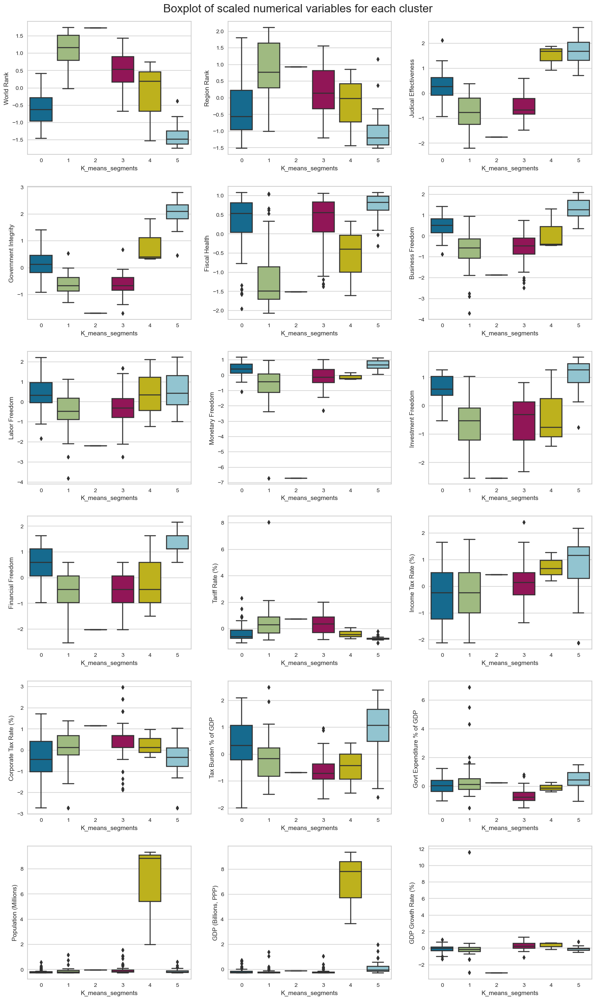

<IPython.core.display.Javascript object>

In [98]:
fig, axes = plt.subplots(6, 3, figsize=(15, 25))
fig.suptitle("Boxplot of scaled numerical variables for each cluster", fontsize=20)
counter = 0
for ii in range(6):
    sns.boxplot(
        ax=axes[ii][0],
        y=k_means_df[num_cols[counter]],
        x=k_means_df["K_means_segments"],
    )
    counter = counter + 1
    sns.boxplot(
        ax=axes[ii][1],
        y=k_means_df[num_cols[counter]],
        x=k_means_df["K_means_segments"],
    )
    counter = counter + 1
    sns.boxplot(
        ax=axes[ii][2],
        y=k_means_df[num_cols[counter]],
        x=k_means_df["K_means_segments"],
    )
    counter = counter + 1


fig.tight_layout(pad=2.0)

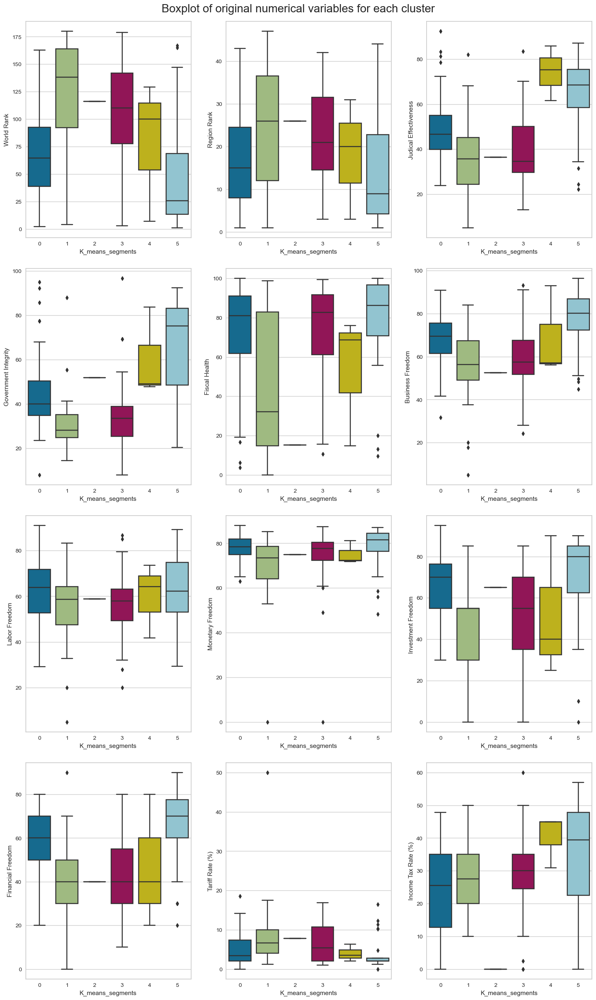

<IPython.core.display.Javascript object>

In [99]:
fig, axes = plt.subplots(4, 3, figsize=(15, 25))
fig.suptitle("Boxplot of original numerical variables for each cluster", fontsize=20)
counter = 0
for ii in range(4):
    sns.boxplot(
        ax=axes[ii][0], y=df1[num_cols[counter]], x=k_means_df["K_means_segments"]
    )
    counter = counter + 1
    sns.boxplot(
        ax=axes[ii][1], y=df1[num_cols[counter]], x=k_means_df["K_means_segments"]
    )
    counter = counter + 1
    sns.boxplot(
        ax=axes[ii][2], y=df1[num_cols[counter]], x=k_means_df["K_means_segments"]
    )
    counter = counter + 1


fig.tight_layout(pad=2.0)

### Cluster Profiling: Hierarchical Clustering

In [100]:
hc_cluster_profile = df2.groupby("HC_segments").mean()

<IPython.core.display.Javascript object>

In [101]:
hc_cluster_profile["count_in_each_segment"] = (
    df2.groupby("HC_segments")["World Rank"].count().values
)

<IPython.core.display.Javascript object>

In [102]:
hc_cluster_profile

,World Rank,Region Rank,Judical Effectiveness,Government Integrity,Fiscal Health,Business Freedom,Labor Freedom,Monetary Freedom,Investment Freedom,Financial Freedom,Tariff Rate (%),Income Tax Rate (%),Corporate Tax Rate (%),Tax Burden % of GDP,Govt Expenditure % of GDP,Population (Millions),"GDP (Billions, PPP)",GDP Growth Rate (%),5 Year GDP Growth Rate (%),GDP per Capita (PPP),Unemployment (%),Inflation (%),FDI Inflow (Millions),Public Debt (% of GDP),count_in_each_segment
HC_segments,,,,,,,,,,,,,,,,,,,,,,,,,
0,89.893855,20.198324,44.963687,41.617877,66.917877,64.10,59.851397,76.056425,58.128492,49.273743,5.762849,28.176536,23.894972,22.073464,32.898324,24.206704,418.377095,3.165922,3.063687,20639.972067,7.381006,4.531844,5501.739106,56.555307,179
1,114.500000,25.500000,68.400000,48.450000,45.350000,56.65,53.000000,72.150000,32.500000,30.000000,4.900000,37.950000,28.700000,12.350000,29.550000,1353.500000,16309.050000,6.800000,7.150000,11921.500000,4.100000,2.600000,88118.050000,59.000000,2
2,12.000000,2.000000,78.600000,77.400000,53.100000,83.80,89.400000,76.600000,85.000000,80.000000,1.700000,37.000000,21.000000,26.000000,37.800000,325.900000,19390.600000,2.300000,2.200000,59501.000000,4.400000,2.100000,275381.000000,107.800000,1
3,180.000000,43.000000,5.000000,24.400000,0.000000,5.00,5.000000,0.000000,0.000000,0.000000,50.000000,25.000000,24.500000,15.600000,100.000000,25.400000,40.000000,1.100000,3.950000,1700.000000,4.800000,3.200000,63.400000,40.700000,1
4,179.000000,32.000000,13.100000,7.900000,17.600000,33.90,28.000000,0.000000,0.000000,10.000000,10.000000,34.000000,34.000000,14.900000,37.400000,31.400000,380.700000,-14.000000,-7.800000,12114.000000,7.700000,1087.500000,-68.000000,34.900000,1
5,89.000000,7.500000,24.400000,15.800000,20.000000,40.20,51.300000,52.800000,5.000000,60.000000,4.050000,10.000000,20.000000,11.350000,139.200000,6.400000,64.400000,70.800000,-7.900000,9986.000000,17.700000,28.000000,1542.900000,4.700000,1


<IPython.core.display.Javascript object>

In [103]:
# let's see the names of the countries in each cluster
for cl in df2["HC_segments"].unique():
    print(
        "The",
        df2[df2["HC_segments"] == cl]["Country"].nunique(),
        "countries in cluster",
        cl,
        "are:",
    )
    print(df2[df2["HC_segments"] == cl]["Country"].unique())
    print("-" * 100, "\n")

The 179 countries in cluster 0 are:
['Afghanistan' 'Albania' 'Algeria' 'Angola' 'Argentina' 'Armenia'
 'Australia' 'Austria' 'Azerbaijan' 'Bahamas' 'Bahrain' 'Bangladesh'
 'Barbados' 'Belarus' 'Belgium' 'Belize' 'Benin' 'Bhutan' 'Bolivia'
 'Bosnia and Herzegovina' 'Botswana' 'Brazil' 'Brunei Darussalam'
 'Bulgaria' 'Burkina Faso' 'Burma' 'Burundi' 'Cambodia' 'Cameroon'
 'Canada' 'Cabo Verde' 'Central African Republic' 'Chad' 'Chile'
 'Colombia' 'Comoros' 'Congo, Democratic Republic of the Congo'
 'Congo, Republic of' 'Costa Rica' "Côte d'Ivoire" 'Croatia' 'Cuba'
 'Cyprus' 'Czech Republic' 'Denmark' 'Djibouti' 'Dominica'
 'Dominican Republic' 'Ecuador' 'Egypt' 'El Salvador' 'Equatorial Guinea'
 'Eritrea' 'Estonia' 'Eswatini' 'Ethiopia' 'Fiji' 'Finland' 'France'
 'Gabon' 'Gambia' 'Georgia' 'Germany' 'Ghana' 'Greece' 'Guatemala'
 'Guinea' 'Guinea-Bissau' 'Guyana' 'Haiti' 'Honduras' 'Hong Kong'
 'Hungary' 'Iceland' 'Indonesia' 'Iran' 'Iraq' 'Ireland' 'Israel' 'Italy'
 'Jamaica' 'Japan' 'Jo

<IPython.core.display.Javascript object>

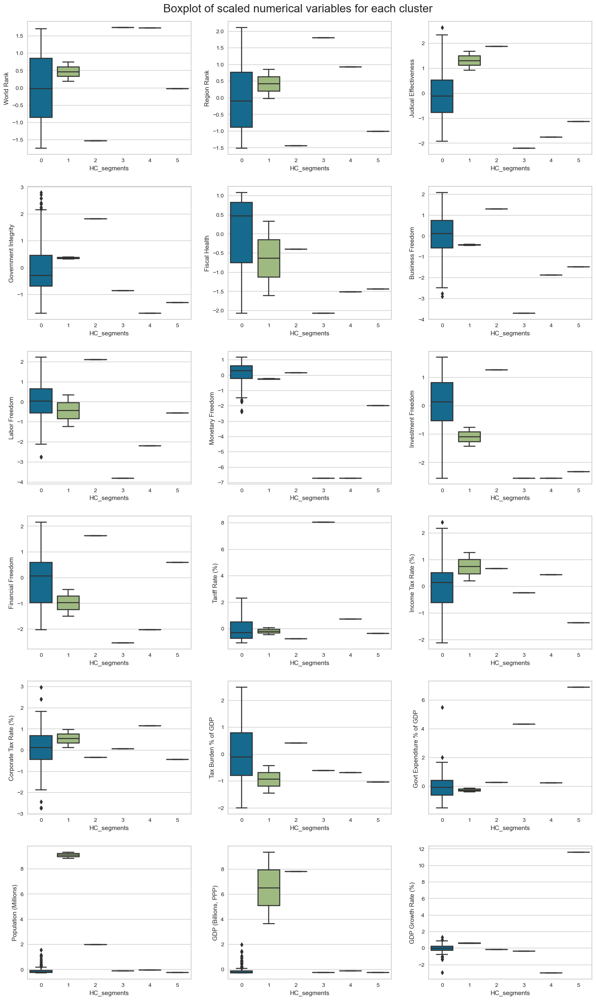

<IPython.core.display.Javascript object>

In [104]:
fig, axes = plt.subplots(6, 3, figsize=(15, 25))
fig.suptitle("Boxplot of scaled numerical variables for each cluster", fontsize=20)
counter = 0
for ii in range(6):
    sns.boxplot(
        ax=axes[ii][0],
        y=hc_df[num_cols[counter]],
        x=hc_df["HC_segments"],
    )
    counter = counter + 1
    sns.boxplot(
        ax=axes[ii][1],
        y=hc_df[num_cols[counter]],
        x=hc_df["HC_segments"],
    )
    counter = counter + 1
    sns.boxplot(
        ax=axes[ii][2],
        y=hc_df[num_cols[counter]],
        x=hc_df["HC_segments"],
    )
    counter = counter + 1


fig.tight_layout(pad=2.0)

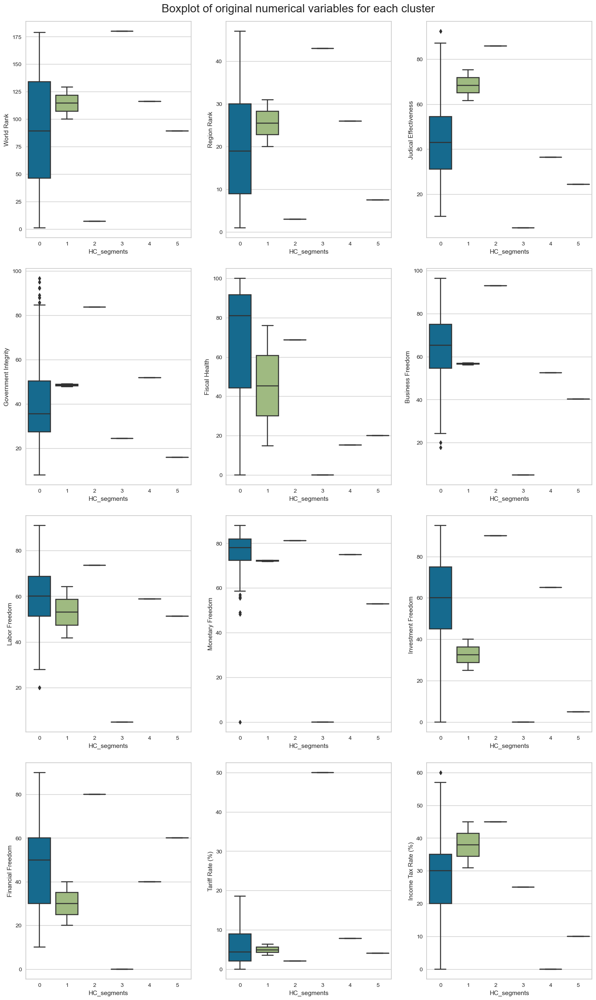

<IPython.core.display.Javascript object>

In [105]:
fig, axes = plt.subplots(4, 3, figsize=(15, 25))
fig.suptitle("Boxplot of original numerical variables for each cluster", fontsize=20)
counter = 0
for ii in range(4):
    sns.boxplot(ax=axes[ii][0], y=df2[num_cols[counter]], x=hc_df["HC_segments"])
    counter = counter + 1
    sns.boxplot(ax=axes[ii][1], y=df2[num_cols[counter]], x=hc_df["HC_segments"])
    counter = counter + 1
    sns.boxplot(ax=axes[ii][2], y=df2[num_cols[counter]], x=hc_df["HC_segments"])
    counter = counter + 1


fig.tight_layout(pad=2.0)

### The clusters with K means has more variablity than with Hierarchial Clustering

### K-Means Clustering vs Hierarchical Clustering Comparison

In [106]:
km_cluster_profile.style.highlight_max(color="lightgreen", axis=0)

,World Rank,Region Rank,Judical Effectiveness,Government Integrity,Fiscal Health,Business Freedom,Labor Freedom,Monetary Freedom,Investment Freedom,Financial Freedom,Tariff Rate (%),Income Tax Rate (%),Corporate Tax Rate (%),Tax Burden % of GDP,Govt Expenditure % of GDP,Population (Millions),"GDP (Billions, PPP)",GDP Growth Rate (%),5 Year GDP Growth Rate (%),GDP per Capita (PPP),Unemployment (%),Inflation (%),FDI Inflow (Millions),Public Debt (% of GDP),count_in_each_segment
K_means_segments,,,,,,,,,,,,,,,,,,,,,,,,,
0,58.918033,16.278689,49.531148,44.040984,74.285246,70.585246,64.673770,79.396721,69.426230,56.721311,4.134426,24.088525,21.000000,25.016393,34.355738,14.327869,346.057377,2.937705,2.570492,25216.655738,9.542623,2.700000,3455.545902,58.322951,61
1,146.000000,30.186047,30.844186,28.655814,29.558140,52.841860,52.820930,67.925581,40.232558,36.976744,8.825581,25.116279,25.383721,20.283721,41.888372,23.283721,306.676744,3.441860,1.791860,9169.883721,9.009302,8.511628,2922.332558,65.165116,43
2,179.000000,32.000000,13.100000,7.900000,17.600000,33.900000,28.000000,0.000000,0.000000,10.000000,10.000000,34.000000,34.000000,14.900000,37.400000,31.400000,380.700000,-14.000000,-7.800000,12114.000000,7.700000,1087.500000,-68.000000,34.900000,1
3,117.843137,23.039216,34.994118,28.821569,76.480392,54.215686,54.870588,73.723529,46.372549,37.450980,7.876471,30.290196,27.794118,15.207843,23.419608,37.141176,241.000000,4.670588,4.737255,5625.666667,4.905882,5.354902,1917.688235,44.082353,51
4,80.333333,17.666667,71.800000,58.100000,47.933333,65.700000,65.133333,73.633333,50.000000,46.666667,3.833333,37.633333,26.133333,16.900000,32.300000,1010.966667,17336.233333,5.300000,5.500000,27781.333333,4.200000,2.433333,150539.033333,75.266667,3
5,18.384615,7.692308,74.826923,80.815385,88.284615,83.700000,67.496154,82.423077,80.000000,73.846154,2.007692,37.861538,20.450000,30.934615,39.873077,22.900000,1092.550000,2.815385,2.653846,57185.038462,4.769231,1.484615,21237.188462,60.030769,26


<IPython.core.display.Javascript object>

In [107]:
hc_cluster_profile.style.highlight_max(color="lightgreen", axis=0)

,World Rank,Region Rank,Judical Effectiveness,Government Integrity,Fiscal Health,Business Freedom,Labor Freedom,Monetary Freedom,Investment Freedom,Financial Freedom,Tariff Rate (%),Income Tax Rate (%),Corporate Tax Rate (%),Tax Burden % of GDP,Govt Expenditure % of GDP,Population (Millions),"GDP (Billions, PPP)",GDP Growth Rate (%),5 Year GDP Growth Rate (%),GDP per Capita (PPP),Unemployment (%),Inflation (%),FDI Inflow (Millions),Public Debt (% of GDP),count_in_each_segment
HC_segments,,,,,,,,,,,,,,,,,,,,,,,,,
0,89.893855,20.198324,44.963687,41.617877,66.917877,64.100000,59.851397,76.056425,58.128492,49.273743,5.762849,28.176536,23.894972,22.073464,32.898324,24.206704,418.377095,3.165922,3.063687,20639.972067,7.381006,4.531844,5501.739106,56.555307,179
1,114.500000,25.500000,68.400000,48.450000,45.350000,56.650000,53.000000,72.150000,32.500000,30.000000,4.900000,37.950000,28.700000,12.350000,29.550000,1353.500000,16309.050000,6.800000,7.150000,11921.500000,4.100000,2.600000,88118.050000,59.000000,2
2,12.000000,2.000000,78.600000,77.400000,53.100000,83.800000,89.400000,76.600000,85.000000,80.000000,1.700000,37.000000,21.000000,26.000000,37.800000,325.900000,19390.600000,2.300000,2.200000,59501.000000,4.400000,2.100000,275381.000000,107.800000,1
3,180.000000,43.000000,5.000000,24.400000,0.000000,5.000000,5.000000,0.000000,0.000000,0.000000,50.000000,25.000000,24.500000,15.600000,100.000000,25.400000,40.000000,1.100000,3.950000,1700.000000,4.800000,3.200000,63.400000,40.700000,1
4,179.000000,32.000000,13.100000,7.900000,17.600000,33.900000,28.000000,0.000000,0.000000,10.000000,10.000000,34.000000,34.000000,14.900000,37.400000,31.400000,380.700000,-14.000000,-7.800000,12114.000000,7.700000,1087.500000,-68.000000,34.900000,1
5,89.000000,7.500000,24.400000,15.800000,20.000000,40.200000,51.300000,52.800000,5.000000,60.000000,4.050000,10.000000,20.000000,11.350000,139.200000,6.400000,64.400000,70.800000,-7.900000,9986.000000,17.700000,28.000000,1542.900000,4.700000,1


<IPython.core.display.Javascript object>

<AxesSubplot:xlabel='K_means_segments'>

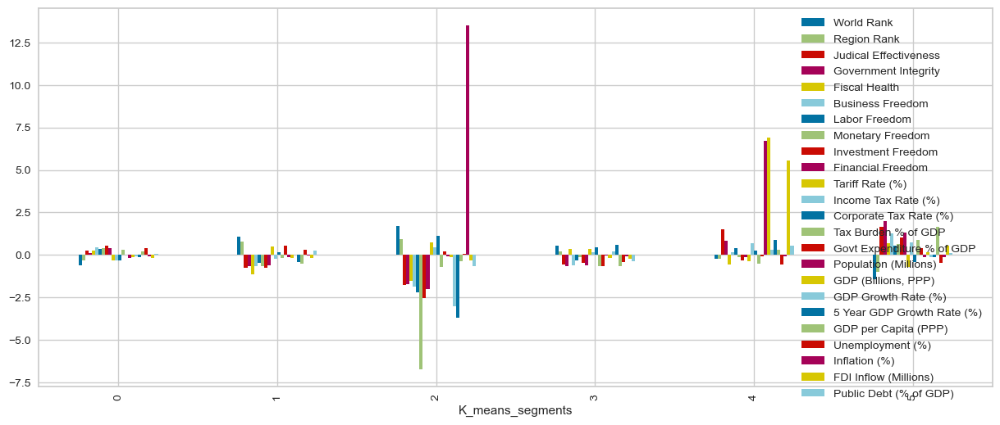

<IPython.core.display.Javascript object>

In [108]:
k_means_df.groupby("K_means_segments").mean().plot.bar(figsize=(15, 6))

<AxesSubplot:xlabel='HC_segments'>

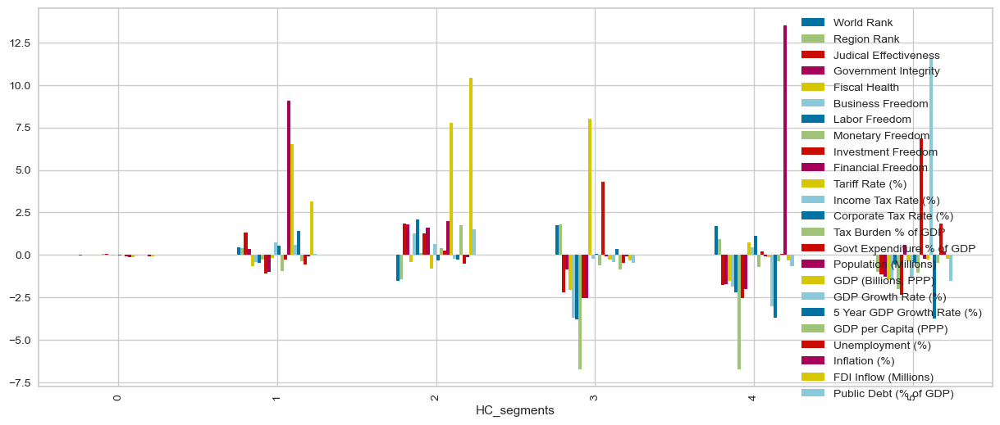

<IPython.core.display.Javascript object>

In [109]:
hc_df.groupby("HC_segments").mean().plot.bar(figsize=(15, 6))

## Inferences

**Cluster 0**
* There are 61 countries in this cluster. This is the cluster with highest number of countries.
* These countries are rated by high unemployment  
 
**Cluster 1**
* There are 43 countries in this cluster.
* There is very high government expenditure 
   
**Cluster 2**
* There is only 1 country in this cluster. 
* Venezeule is the country.
* Inflation at 1087%, Tarrif rate (%) at 10% and Corporate Tax Rate (%) at 34%
   
**Cluster 3**
* There are 51 countries in this cluster.
* These are countries with moderate ease to do busniess. 
    
**Cluster 4**
* There are 3 countries in this cluster. 
* China, India and United States of America are in this cluster. 
* These countries are having highest Population (Millions), GDP (Billions, PPP) GDP Growth Rate (%), 5 Year GDP Growth Rate (%)
   
**Cluster 5**
* There are 26 countries in this cluster.
* These countries are better Judical Effectiveness, Government Integrity, Fiscal Health, Business Freedom, Labor Freedom, Monetary Freedom, Investment Freedom, Financial Freedom, Income Tax Rate (%), Tax Burden % of GDP and GDP per Capita (PPP). 
* Most of these are european countries. 
  
**Recommendations for the ease of doing business**

* Cluster (0) - These contries are categorized for their high unemployment. With large untapped human resurces, these countries might be serve a good oppertunity for service based indutries and business. Also a good operunity for Government's to implement measures to increase employment by promoting bew business with economic freedom. has a relatively high ranking in terms of the overall score, indicating that it is a relatively favorable segment to do business in. It has a high ranking in fiscal health, business freedom, labor freedom, and financial freedom, which suggests that the economic and regulatory environment is generally favorable for business operations. Additionally, it has a relatively low tariff rate and a low tax burden as a percentage of GDP, which could make it more attractive for businesses to operate in. It has a relatively high population and a positive GDP growth rate, indicating a potentially growing and dynamic market. However, it has a lower ranking in government integrity and judicial effectiveness, which may suggest some instability or corruption within the political and legal systems.

* Clsuter (1) - Has high governament funding. If specific countries are in freedom rankings might be very good oppertunities to invest. Has a relatively low ranking in terms of the overall score, indicating that it may not be a favorable segment to do business in. It has a low ranking in most categories, including government integrity, fiscal health, and business freedom, suggesting that the economic and regulatory environment may not be conducive to business operations. The tariff rate and tax burden as a percentage of GDP are also relatively high, which could make it less attractive for businesses to operate in. Additionally, it has a relatively small population and low GDP growth rate, indicating a potentially stagnant or struggling market. However, it does have a relatively high ranking in labor freedom, which suggests that the labor market may be more open and flexible than in other segments.

* Cluster (2) - With the data provided, Venezuela might not be a good option for busniess and economic freedom. Has the lowest overall score among all the segments, indicating that it is not an ideal segment for business operations. It has the lowest rankings in most categories, including judicial effectiveness, government integrity, fiscal health, business freedom, labor freedom, monetary freedom, investment freedom, and financial freedom, suggesting a challenging regulatory and economic environment. Additionally, it has a high tariff rate and public debt as a percentage of GDP, which may deter businesses from investing in the segment. The GDP growth rate is also negative, which indicates an economy in decline. Overall, segment 2 appears to have significant economic and regulatory challenges, and it may not be a suitable market for businesses to operate in.

* Cluster (3) - has the lowest ranking in terms of the overall score, indicating that it is the least favorable segment to do business in. It has a low ranking in judicial effectiveness, government integrity, and investment freedom, which suggests that the legal and regulatory environment may be less stable and less conducive to business investment. Additionally, it has a relatively high corporate tax rate and a high tax burden as a percentage of GDP, which could make it less attractive for businesses to operate in. However, it has a relatively low tariff rate and a relatively low population, which could potentially make it easier for businesses to operate and compete in its market. Its negative GDP growth rate suggests that the economy is contracting, which could further hinder business opportunities in this segment.

* Cluster (4) - Can be good oppertunity to invest if aiming for large scale and wide spread product adoption as these are countries with very largest population.has a relatively high ranking in judicial effectiveness and government integrity, indicating a relatively stable legal and political environment. It also has a high ranking in fiscal health, indicating a relatively healthy economy. However, it has a relatively low ranking in business freedom and labor freedom, suggesting that the regulatory environment may be more restrictive compared to other segments. Additionally, its income tax rate is quite high compared to other segments, which could potentially deter business investment. Despite this, it has a high GDP per capita and a high GDP growth rate, indicating a growing economy with significant potential for growth.

* Cluster (5) - Will be a very safe bet to invest however with most of these countries already high economic freedom rankings, so there might be very high competetion for business. 26 countries appears to be the best segment to do business in. This segment has the highest rankings in judicial effectiveness, government integrity, fiscal health, business freedom, labor freedom, monetary freedom, investment freedom, financial freedom, and the lowest tariff rate and income tax rate. Additionally, it has a relatively low unemployment rate and inflation rate, and high FDI inflow. Its GDP per capita is also the highest among all segments.

## PCA for visualization

**Using PCA to reduce the data to two dimensions and visualize it to see how well-separated the clusters are**

In [110]:
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
X_reduced_pca = pca.fit_transform(subset_scaled_df)

# storing results in a dataframe
reduced_data_df_pca = pd.DataFrame(
    data=X_reduced_pca, columns=["Component 1", "Component 2"]
)

# checking the amount of variance explained
print(
    f"The first two principal components explain {np.round(100*pca.explained_variance_ratio_.sum(), 2)}% of the variance in the data."
)

The first two principal components explain 40.02% of the variance in the data.


<IPython.core.display.Javascript object>

<AxesSubplot:xlabel='Component 1', ylabel='Component 2'>

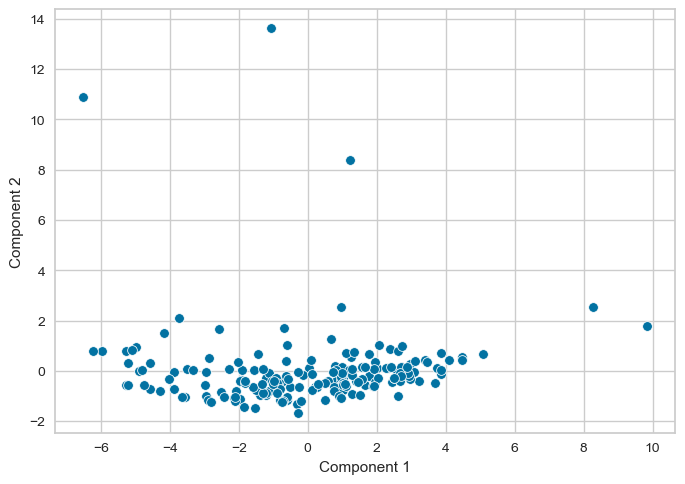

<IPython.core.display.Javascript object>

In [111]:
sns.scatterplot(data=reduced_data_df_pca, x="Component 1", y="Component 2")

<AxesSubplot:xlabel='Component 1', ylabel='Component 2'>

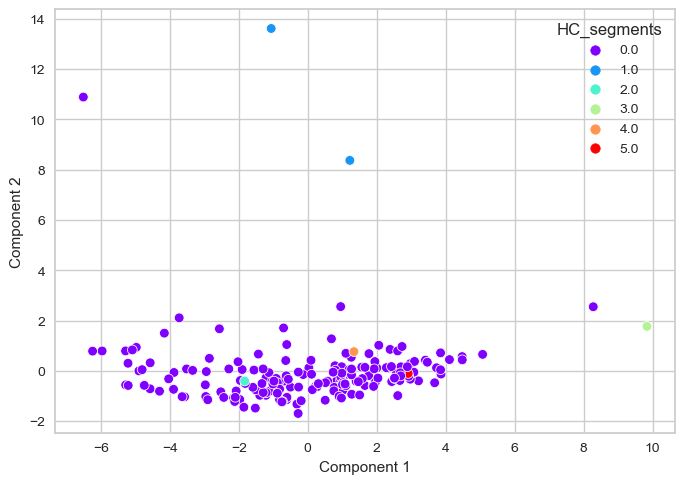

<IPython.core.display.Javascript object>

In [112]:
sns.scatterplot(
    data=reduced_data_df_pca,
    x="Component 1",
    y="Component 2",
    hue=df2["HC_segments"],
    palette="rainbow",
)

<AxesSubplot:xlabel='Component 1', ylabel='Component 2'>

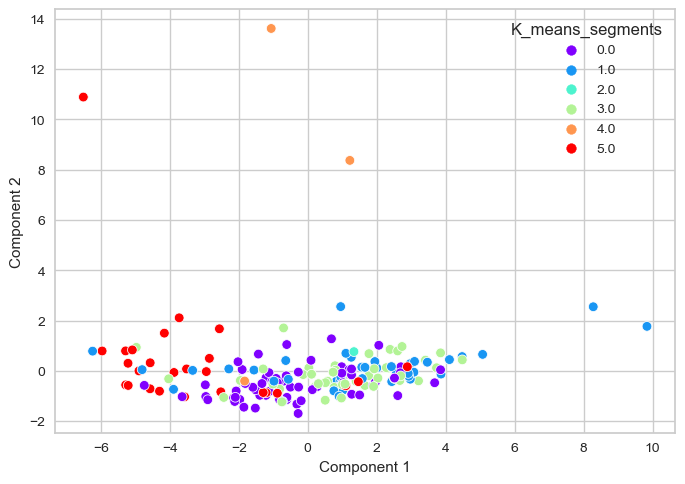

<IPython.core.display.Javascript object>

In [113]:
sns.scatterplot(
    data=reduced_data_df_pca,
    x="Component 1",
    y="Component 2",
    hue=df1["K_means_segments"],
    palette="rainbow",
)

## Cluster Overlapping

In [114]:
k_means_df

,World Rank,Region Rank,Judical Effectiveness,Government Integrity,Fiscal Health,Business Freedom,Labor Freedom,Monetary Freedom,Investment Freedom,Financial Freedom,Tariff Rate (%),Income Tax Rate (%),Corporate Tax Rate (%),Tax Burden % of GDP,Govt Expenditure % of GDP,Population (Millions),"GDP (Billions, PPP)",GDP Growth Rate (%),5 Year GDP Growth Rate (%),GDP per Capita (PPP),Unemployment (%),Inflation (%),FDI Inflow (Millions),Public Debt (% of GDP),K_means_segments
0,1.193634,1.477149,-0.847346,-0.824244,1.059499,-0.908450,0.068473,0.146085,-2.105828,-2.025261,0.185245,-0.623712,-0.452874,-1.669030,-0.538495,-0.032172,-0.257613,-0.165744,-0.030997,-0.837526,0.254568,-0.068703,-0.300952,-1.451377,3
1,-0.753653,0.530477,-0.791962,-0.054219,0.469344,0.367209,-0.470721,0.576060,0.577834,1.105714,-0.890834,-0.396796,-1.023516,0.301193,-0.283942,-0.257368,-0.271598,0.075423,-0.168759,-0.362311,1.164361,-0.106374,-0.259421,0.438418,0
2,1.563619,-0.495084,-0.481811,-0.636804,-1.484166,-0.121477,-0.666791,-0.015156,-1.211274,-0.981603,0.513541,0.510868,-0.110489,0.261590,0.492771,0.009275,-0.023165,-0.251875,0.037885,-0.239329,0.468637,-0.061169,-0.256150,-0.904253,1
3,1.271526,1.003813,-1.013498,-1.062344,-0.237580,-0.495924,-0.043567,-1.761928,-1.211274,-0.459774,0.622973,-0.850628,0.688411,-0.124534,-0.558076,-0.082599,-0.207377,-0.475816,-0.030997,-0.621519,0.147534,0.266566,-0.390955,0.263930,1
4,1.115743,0.451588,-0.022124,-0.403770,-1.032870,-0.451498,-0.876867,-1.331953,-0.093082,0.583884,0.276439,0.510868,0.688411,0.885329,0.466663,0.027236,0.096410,-0.096839,-0.788689,0.014698,0.236729,0.191224,0.159239,-0.111663,1
5,-0.851017,0.293809,0.077568,-0.145407,-0.401688,0.938399,0.838750,0.244621,0.801472,1.105714,-0.708448,-0.169880,-0.452874,-0.055229,-0.486279,-0.256677,-0.274803,0.695567,0.210087,-0.499754,1.931440,-0.120186,-0.293474,-0.085046,0
6,-1.668878,-1.283977,2.304006,1.946832,0.646075,1.573055,1.728070,1.032908,1.025110,2.149372,-0.872595,1.267254,0.688411,0.627913,0.172948,-0.106086,0.232218,-0.200197,-0.203199,1.341731,-0.316282,-0.106374,1.504791,-0.436980,5
7,-1.162583,-0.337305,1.462168,1.820183,0.623983,0.722616,0.649682,0.576060,1.472387,1.105714,-0.726686,1.645448,0.117768,2.063503,1.067147,-0.216611,-0.103618,-0.096839,-0.582046,1.320784,-0.334121,-0.103862,0.072395,0.663183,5
8,-0.597870,-0.573973,0.454179,0.163617,0.747064,0.379902,0.313561,-1.081135,0.130557,0.583884,-0.143050,-0.245519,-0.452874,-0.678968,0.186002,-0.209704,-0.215077,-0.579174,-0.616486,-0.137745,-0.423316,0.031752,-0.191272,-0.049557,0
9,-0.286304,-0.416194,0.110798,0.112957,-0.000887,0.316436,0.565652,0.271494,-0.316720,0.583884,2.300927,-2.136486,-2.735443,-0.550260,-0.838737,-0.274637,-0.281753,-0.372459,-1.270857,0.477029,0.932453,-0.113908,-0.266884,0.024379,0


<IPython.core.display.Javascript object>

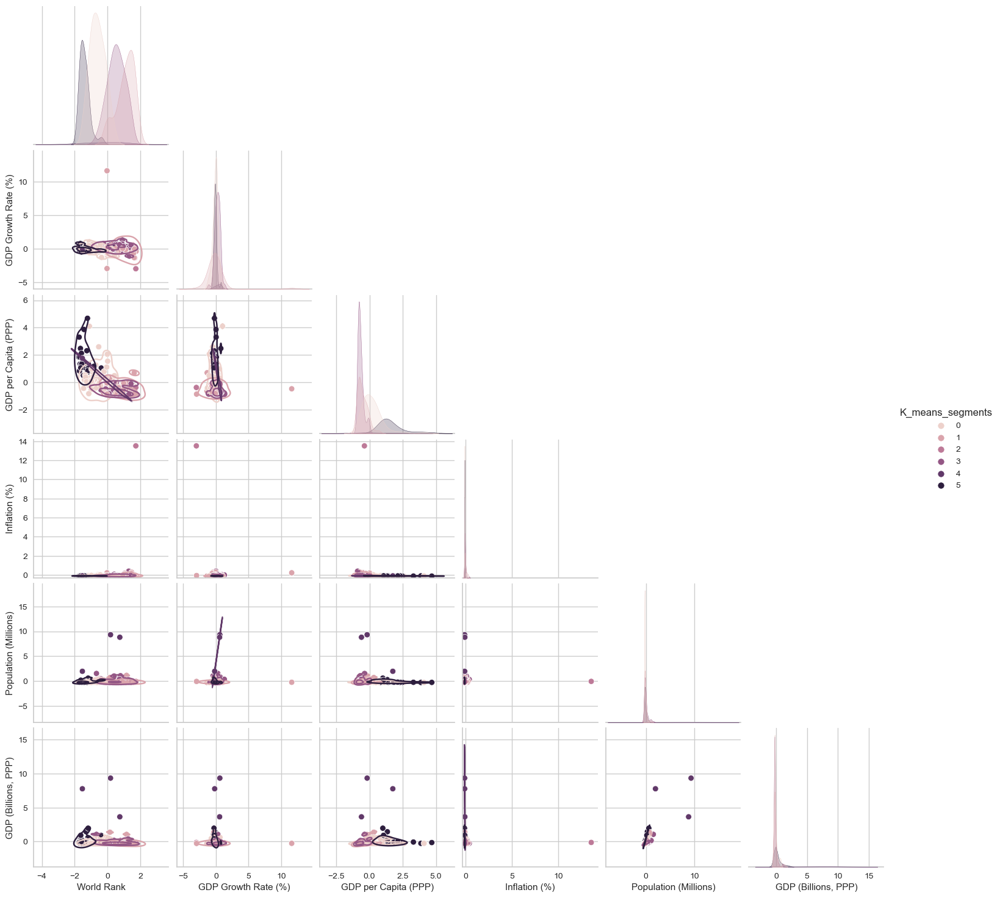

<IPython.core.display.Javascript object>

In [115]:
# let's see if there is any overlap in the clusters
g = sns.pairplot(
    k_means_df[
        [
            "World Rank",
            "GDP Growth Rate (%)",
            "GDP per Capita (PPP)",
            "Inflation (%)",
            "Population (Millions)",
            "GDP (Billions, PPP)",
            "K_means_segments",
        ]
    ],
    diag_kind="kde",
    corner=True,
    hue="K_means_segments",
)
g.map_lower(sns.kdeplot, levels=3, color=".2")
plt.show()

In [116]:
df1.head()

,Country,Region,World Rank,Region Rank,Judical Effectiveness,Government Integrity,Fiscal Health,Business Freedom,Labor Freedom,Monetary Freedom,Investment Freedom,Financial Freedom,Tariff Rate (%),Income Tax Rate (%),Corporate Tax Rate (%),Tax Burden % of GDP,Govt Expenditure % of GDP,Population (Millions),"GDP (Billions, PPP)",GDP Growth Rate (%),5 Year GDP Growth Rate (%),GDP per Capita (PPP),Unemployment (%),Inflation (%),FDI Inflow (Millions),Public Debt (% of GDP),K_means_segments
0,Afghanistan,Asia-Pacific,152.0,39.0,29.6,25.2,99.3,49.2,60.4,76.7,10.0,10.0,7.0,20.0,20.0,5.0,25.6,35.5,69.6,2.5,2.9,1958.0,8.8,5.0,53.9,7.3,3
1,Albania,Europe,52.0,27.0,30.6,40.4,80.6,69.3,52.7,81.5,70.0,70.0,1.1,23.0,15.0,24.9,29.5,2.9,36.0,3.9,2.5,12507.0,13.9,2.0,1119.1,71.2,0
2,Algeria,Middle East and North Africa,171.0,14.0,36.2,28.9,18.7,61.6,49.9,74.9,30.0,30.0,8.8,35.0,23.0,24.5,41.4,41.5,632.9,2.0,3.1,15237.0,10.0,5.6,1203.0,25.8,1
3,Angola,Sub-Saharan Africa,156.0,33.0,26.6,20.5,58.2,55.7,58.8,55.4,30.0,40.0,9.4,17.0,30.0,20.6,25.3,28.2,190.3,0.7,2.9,6753.0,8.2,31.7,-2254.5,65.3,1
4,Argentina,Americas,148.0,26.0,44.5,33.5,33.0,56.4,46.9,60.2,55.0,60.0,7.5,35.0,30.0,30.8,41.0,44.1,920.2,2.9,0.7,20876.0,8.7,25.7,11857.0,52.6,1


<IPython.core.display.Javascript object>